### Question 7
Write a function `count_masks(dataset)` which will count the number of faces correctly
wearing mask (with_mask class), without mask (without_mask class) and incorrectly wearing
mask (mask_weared_incorrect class) in the list of images dataset which is an instantiation of
the MaskedFaceTestDataset class shown below. (Hint: You are expected to implement a 3
class (4 class with background) masked face detector which can detect the aforementioned
categories of objects in a given image. However, you are absolutely free to be more
innovative and come out with different solutions for this problem.)

First of all let's build the class for handling the dataset

In [36]:
import os, sys
import torch, torchvision
from torch.utils.data import Dataset, DataLoader
import torch.optim as optim
import albumentations as A #note installing this changes your version of OpenCV and you loose sift
from albumentations.pytorch import ToTensorV2
from tqdm import tqdm
import time

import cv2, glob
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from xml.etree import ElementTree as et
from sklearn.model_selection import train_test_split
from iterstrat.ml_stratifiers import MultilabelStratifiedKFold


Let's create a PyTorch dataset class for the face mask detection task. It will prepare and provide individual samples (image and corresponding annotations) for training or testing.

In [2]:
class MaskedFaceTestDataset(Dataset):
      '''
      Params:
            -root      ---- root directory of the data
            -transforms  -- transformations to perform on both the images and the annotations
            -width     ---- the desired width of the images as an input to the model
            -height    ---- the desired height of the images as an input to the model
      '''

      def __init__(self, images, annotations, img_dir, annt_dir, width, height, transform=None):
            #super(MaskedFaceTestDataset, self).__init__()
            self.imgs = images
            self.ants = annotations
            self.img_dir = img_dir
            self.annt_dir = annt_dir
            self.width = width
            self.height = height
            self.transform = transform

            # defining the classes
            self.classes = [None, 'without_mask', 'with_mask', 'mask_weared_incorrect'] #class 0 for background
      
      def __getitem__(self, index):
            img_name = self.imgs[index]
            img_path = os.path.join(self.img_dir, img_name)

            # use cv2 to open image since we want to resize the image and avoid distortions
            img = cv2.imread(img_path)
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB).astype(np.float32)    
            img_res = cv2.resize(img, (self.width, self.height), cv2.INTER_AREA)  # resize the image
            
            annt_filename = self.ants[index]
            annt_path = os.path.join(self.annt_dir, annt_filename)
            #annt_path = self.ants[index] # get the exact annot path

            boxes = []
            labels = []
            tree = et.parse(annt_path)
            root = tree.getroot()

            org_height, org_width = img.shape[0], img.shape[1] # get original dimension of image
            for member in root.findall('object'):
                  # append the box text label to the array
                  labels.append(self.classes.index(member.find('name').text))

                  xmin = int(member.find('bndbox').find('xmin').text)
                  ymin = int(member.find('bndbox').find('ymin').text)
                  xmax = int(member.find('bndbox').find('xmax').text)
                  ymax = int(member.find('bndbox').find('ymax').text)

                  # convert coordinates to image's new size
                  xmin_coor = (xmin/(org_width+1)) * (self.width-1)
                  ymin_coor = (ymin/(org_height+1)) * (self.height-1)
                  xmax_coor = (xmax/(org_width+1)) * (self.width-1)
                  ymax_coor = (ymax/(org_height+1)) * (self.height-1)

                  boxes.append([xmin_coor, ymin_coor, xmax_coor, ymax_coor])

            boxes = torch.as_tensor(boxes, dtype=torch.float32)
            area = (boxes[:,3]-boxes[:,1]) * (boxes[:,2]-boxes[:,0])
            iscrowd = torch.zeros((boxes.shape[0],), dtype=torch.int64)
            labels = torch.as_tensor(labels, dtype=torch.int64)
            image_id = torch.tensor([index])

            target = {'boxes': boxes, 'labels': labels, 'area': area,
                      'iscrowd': iscrowd, 'image_id':image_id
                      }

            if self.transform is not None:
                  sample = self.transform(image = img_res,
                                       bboxes = target['boxes'],
                                       labels = labels)
                  img_res = sample['image']
                  #target['boxes'] = torch.Tensor(sample['bboxes'])
                  target['boxes'] = torch.as_tensor(sample['bboxes'], dtype=torch.float32)

            return img_res, target
      
      def __len__(self):
            return len(self.imgs)

Let's create another class which will handle the loading and splitting of the data based on the configuration received i.e. the `Config` class into training and cross-validation sample. MultiLabelKFold stratified split will be done later one but this is just to randomly split the training set

In [3]:
class FaceMaskData:
      def __init__(self, images_path, annotations_path, multilabelKFold=False, df_file=None):
            """
            Parameters:
            - images_path: Path to the directory containing images.
            - annotations_path: Path to the directory containing annotations.
            - multilabelKFold: Flag for enabling multi-label K-Fold cross-validation.
            - df_file: DataFrame containing file information (for multi-label K-Fold).
            """
            self.images_path = images_path
            self.annotations_path = annotations_path
            self.is_loaded = False
            self.multilabelKFold = multilabelKFold
            self.df_file = df_file

            # Define class labels
            self.classes = [None, 'without_mask', 'with_mask', 'mask_weared_incorrect']

      def _split(self, train_size=.8, seed=99): ### deleted droprate
            """
            Split the data into training and testing sets.

            Parameters:
            - train_size: Percentage of data for training.
            - seed: Seed for randomization.

            Returns:
            Training and testing data splits. If multilabel KFold is to be
            applied, then the labels will be return as well
            """
            # Validation checks
            if not self.is_loaded:
                  raise RuntimeError('Split should not be used before `load_data`')

            if train_size > 1 or train_size < 0:
                  raise ValueError('Split sizes can not be greater than 1 or less than 0')

            # # Drop a random percentage of data if specified
            # if drop_rate > 0:
            #       self.images = self.images[:int(len(self.images) * (1 - drop_rate))]
            #       self.annotates = self.annotates[:int(len(self.annotates) * (1 - drop_rate))]
            #       if self.multilabelKFold:
            #             self.labels_encode = self.labels_encode[:int(len(self.labels_encode) * (1 - drop_rate))]

            # Check consistency of lengths
            if len(self.images) != len(self.annotates):
                  raise ValueError('Number of images and annotations should be the same')

            if self.multilabelKFold:
                  if len(self.images) != len(self.labels_encode):
                        raise ValueError('Number of images and encoded labels should be the same for multilabel K-Fold')


            # If train_size is 1, return the entire dataset for training
            if train_size == 1:
                  if self.multilabelKFold:
                        return self.images, self.annotates, self.labels_encode
                  return self.images, self.annotates

            # Otherwise, perform train-test split
            test_size = 1 - train_size
            if self.multilabelKFold:
                  x_train, x_test, y_train, y_test, l_train, l_test = train_test_split(
                                                                              self.images, self.annotates, self.labels_encode, 
                                                                              test_size=test_size, random_state=seed
                                                                              )
                  return (x_train, y_train, l_train), (x_test, y_test, l_test)

            x_train, x_test, y_train, y_test = train_test_split(
                                                      self.images, self.annotates, 
                                                      test_size=test_size, random_state=seed
                                                      )
            return (x_train, y_train), (x_test, y_test)

      def load_data(self, train_size=.8, seed=99):  #deleted droprate
            """
            Load data and optionally split into training and testing sets.

            Parameters:
            - train_size: Percentage of data for training.
            - seed: Seed for randomization.

            Returns:
            Data splits for training and testing.
            """
            self.is_loaded = True

            # # Warn if dropping data
            # if drop_rate > 0:
            #       print('\033[93m-- The data loaded using drop_rate={}, therefore not all of the data will be loaded! --\033[0m'.format(drop_rate))

            # get file names both for images and annots
            self.images = np.array([img for img in sorted(os.listdir(self.images_path)) if img.endswith('.png')])
            self.annotates = np.array([ant for ant in sorted(os.listdir(self.annotations_path)) if ant.endswith('.xml')])

            # If multi-label K-Fold, create encoded labels
            if self.multilabelKFold:
                  self.labels_encode = []
                  for img in self.images:
                        name = img.split('.')[0]
                        y_decode = self.df_file[self.df_file['file'] == name]['name'].unique()
                        y_encode = np.zeros(len(self.classes), dtype=np.uint8)
                        for cl in y_decode:
                              class_idx = self.classes.index(cl)
                              y_encode[class_idx] = 1
                        self.labels_encode.append(y_encode)

            # Return data splits
            return self._split(train_size, seed)

Let's have a configurations class which would hold all our configurations for this model training.

In [4]:
class Config:
      seed = 99
      model_name = 'faster_rcnn'
      pretrained = True
      img_width = 480
      img_height = 480
      batch_size = 10
      n_epochs = 20
      n_folds = 5
      train_size = 1 #0.9
      nms_thresh = 0.2  #non-max suppression threshold
      score_threshold = 0.5
      device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
      num_workers, num_classes = 0, 4
      imgs_path = 'data/Datasets_CV/MaskedFace/train'
      msks_path = 'data/Datasets_CV/MaskedFace/train'
      imgs_test_path = 'data/Datasets_CV/MaskedFace/val'
      msks_test_path = 'data/Datasets_CV/MaskedFace/val'
      multilabelKFold = True

      # our optimizer and scheduler. SGD and StepLR in this case
      optimizer = optim.SGD
      optimizer_dict = {'lr':5e-3, 'momentum':0.9, 'weight_decay':5e-4}

      scheduler = optim.lr_scheduler.StepLR
      scheduler_dict = {'step_size':5, 'gamma':0.1}

      # for saving our configuration parameters
      def save(path):
            save_path = path + '/model_dict.json'
            with open(save_path, 'w') as f:
                  for key, val in Config.__dict__.items():
                        f.write('{}\t\t= {}\n'.format(key,val))

let's set the seed for this training

In [5]:
np.random.seed(Config.seed)

1. Loading the dataset
* Create a dataframe which houses all the annotations information from all the .xml files

In [6]:
def parse_xml(xml_file):
      try:
            tree = et.parse(xml_file)
      except et.ParseError as e:
            print(f"Error parsing XML file {xml_file}: {e}")
            return []
      root = tree.getroot()

      data = []
      for obj in root.findall('object'):
            name = obj.find('name').text
            bndbox = obj.find('bndbox')
            xmin = int(bndbox.find('xmin').text)
            ymin = int(bndbox.find('ymin').text)
            xmax = int(bndbox.find('xmax').text)
            ymax = int(bndbox.find('ymax').text)

            width = int(root.find('size').find('width').text)
            height = int(root.find('size').find('height').text)

            # Calculate additional fields
            box_width = xmax - xmin
            box_height = ymax - ymin
            x_center = (xmin + xmax) / 2.0 / width  # Normalized x-coordinate of the center
            y_center = (ymin + ymax) / 2.0 / height  # Normalized y-coordinate of the center

            # Map class names to class indices
            class_mapping = {"with_mask": 0, "without_mask": 1, "mask_weared_incorrect": 2}
            class_index = class_mapping.get(name, -1)

            data.append({
                  'xmin': xmin,
                  'ymin': ymin,
                  'xmax': xmax,
                  'ymax': ymax,
                  'name': name,
                  'file': os.path.splitext(os.path.basename(xml_file))[0],  # + '.png',
                  'width': width,
                  'height': height,
                  'class': class_index,
                  'Xcent': x_center,
                  'Ycent': y_center,
                  'boxW': box_width,
                  'boxH': box_height
            })

      return data

def create_annotation_df(annotation_folder):
      xml_files = glob.glob(os.path.join(annotation_folder, '*.xml'))

      all_data = []
      for xml_file in xml_files:
            data = parse_xml(xml_file)
            all_data.extend(data)

      df = pd.DataFrame(all_data)
      return df

In [7]:
# Provide the path to your training and test folder containing XML annotations
annotation_folder_path = 'data/Datasets_CV/MaskedFace/train'
val_annota_folder_path = 'data/Datasets_CV/MaskedFace/val'

# Create the DataFrame
train_annotation_df = create_annotation_df(annotation_folder_path)
test_annotation_df = create_annotation_df(val_annota_folder_path)

# Save the DataFrame as a CSV file
train_annotation_df.to_csv('train_annotation.csv', index=False)
test_annotation_df.to_csv('test_annotation.csv', index=False)


# Display the first few rows of the DataFrame
train_annotation_df.head()


,xmin,ymin,xmax,ymax,name,file,width,height,class,Xcent,Ycent,boxW,boxH
0,79,105,109,142,without_mask,mask-000,512,366,1,0.183594,0.337432,30,37
1,185,100,226,144,with_mask,mask-000,512,366,0,0.401367,0.333333,41,44
2,325,90,360,141,without_mask,mask-000,512,366,1,0.668945,0.315574,35,51
3,321,34,354,69,with_mask,mask-001,400,156,0,0.843750,0.330128,33,35
4,224,38,261,73,with_mask,mask-001,400,156,0,0.606250,0.355769,37,35


In [8]:
train_annotation_df[train_annotation_df['file'] == 'mask-737']

,xmin,ymin,xmax,ymax,name,file,width,height,class,Xcent,Ycent,boxW,boxH
2794,28,55,46,71,with_mask,mask-737,400,226,0,0.09250,0.278761,18,16
2795,98,62,111,78,with_mask,mask-737,400,226,0,0.26125,0.309735,13,16
2796,159,50,193,90,mask_weared_incorrect,mask-737,400,226,2,0.44000,0.309735,34,40
2797,293,59,313,80,with_mask,mask-737,400,226,0,0.75750,0.307522,20,21
2798,352,51,372,72,with_mask,mask-737,400,226,0,0.90500,0.272124,20,21
2799,228,53,241,73,with_mask,mask-737,400,226,0,0.58625,0.278761,13,20


* Load the data into a dataset

In [9]:
trn_df = pd.read_csv('train_annotation.csv')
val_df = pd.read_csv('test_annotation.csv')

Assuming that we're doing MultiLabelKFold;

In [10]:
# load training and test data
trn_faceMasksData = FaceMaskData(Config.imgs_path, Config.msks_path, multilabelKFold=True, df_file=trn_df)
x_train, y_train, l_train= trn_faceMasksData.load_data(train_size=Config.train_size, seed=Config.seed)

val_faceMasksData = FaceMaskData(Config.imgs_test_path, Config.msks_test_path, multilabelKFold=False, df_file=val_df)
# trainsize is set to 1 so that there'll be no split. 
x_test, y_test= val_faceMasksData.load_data(train_size=1, seed=Config.seed)


print('Training contains {} samples which is {:g}% of the data'.format(len(x_train), len(x_train) * 100 / (len(x_train) + len(x_test))))
print('Testing contains {} samples which is {:g}% of the data'.format(len(x_test), len(x_test) * 100 / (len(x_train) + len(x_test))))

Training contains 682 samples which is 88.9179% of the data
Testing contains 85 samples which is 11.0821% of the data


* Load our validation dataset

In [11]:
train_trnf = A.Compose([
                        A.OneOf([A.Emboss(p=0.5), A.Sharpen(p=0.5)], p=0.5),
                        A.Rotate(p=0.5, limit=[-35,35]),
                        A.MotionBlur(p=0.3),
                        A.Normalize(
                                    mean=[0.485, 0.456, 0.406],
                                    std=[0.229, 0.224, 0.225]),
                        ToTensorV2(p=1.0)],
                        bbox_params={'format':'pascal_voc',
                                     'label_fields': ['labels'],
                                     'min_visibility': 0.3}
                        )

test_trnf = A.Compose([
                        A.Normalize(
                                    mean=[0.485, 0.456, 0.406],
                                    std=[0.229, 0.224, 0.225]),
                        ToTensorV2(p=1.0)],
                        bbox_params={'format':'pascal_voc',
                                     'label_fields': ['labels'],
                                     'min_visibility': 0.3}
                        )

def collate_fn(batch):
      #images, targets = zip(*batch)
      #images = [img.to(Config.device) for img in images]
      #targets = [{k: v.to(Config.device) for k, v in target.items()} for target in targets]

      return tuple(zip(*batch))

In [19]:
test_set = MaskedFaceTestDataset(x_test, y_test, Config.imgs_test_path, Config.msks_test_path,
                                 Config.img_width, Config.img_height, transform=test_trnf)
test_loader = DataLoader(test_set, batch_size=Config.batch_size, shuffle=False,
                        num_workers=Config.num_workers, collate_fn=collate_fn, pin_memory=True)

2. Split the data. Notice how imbalanced the training data is. A lot more people wore masks compared to those who didn't or even wore it incorrectly.

In [13]:
trn_df.name.value_counts()

name
with_mask                2476
without_mask              578
mask_weared_incorrect      96
Name: count, dtype: int64

In [14]:
classes = [None, 'without_mask', 'with_mask', 'mask_weared_incorrect']

In [15]:
list(np.array([3,54]))

[3, 54]

##### Note that here you made your class as `w/out mask` -- `w/mask` -- `incorr_mask`

In [17]:
x_names = [name.split('.')[0] for name in x_train]
msk_clss = [None, 'without_mask', 'with_mask', 'mask_weared_incorrect']
y_classes = []

for name in x_names:
      classes = list(trn_df[trn_df['file']==name]['name'].unique())
      indice = np.zeros(4, dtype=np.uint8)
      for c in classes:
            index = msk_clss.index(c)
            indice[index] = 1
      y_classes.append(list(indice))

In [20]:
len(test_set.classes)

4

In [21]:
df_folds = []
mskf = MultilabelStratifiedKFold(Config.n_folds)

for fold_id, (train_idx, cv_idx) in enumerate(mskf.split(x_names, y_classes), start=1):
      print('fold {}: train_size={}, test_size={}'.format(fold_id, len(train_idx), len(cv_idx)))

      classes = np.zeros(len(msk_clss))

      for idx in train_idx:
            name = x_names[idx]
            for cl, val in trn_df[trn_df['file']==name]['name'].value_counts().to_dict().items():
                  class_index = msk_clss.index(cl)
                  classes[class_index] += val

      for cl, val in trn_df['name'].value_counts().to_dict().items():
            class_index = msk_clss.index(cl)
            df_folds.append({'fold': int(fold_id), 'class':cl,
                             'count': classes[class_index]})
            
df_folds = pd.DataFrame(df_folds)

fold 1: train_size=548, test_size=134
fold 2: train_size=547, test_size=135
fold 3: train_size=541, test_size=141
fold 4: train_size=547, test_size=135
fold 5: train_size=545, test_size=137


Visualizing the class distribution per fold

,fold,class,count
0,1,with_mask,1952.0
1,1,without_mask,460.0
2,1,mask_weared_incorrect,78.0
3,2,with_mask,1994.0
4,2,without_mask,464.0
5,2,mask_weared_incorrect,78.0
6,3,with_mask,1972.0
7,3,without_mask,427.0
8,3,mask_weared_incorrect,77.0
9,4,with_mask,1930.0


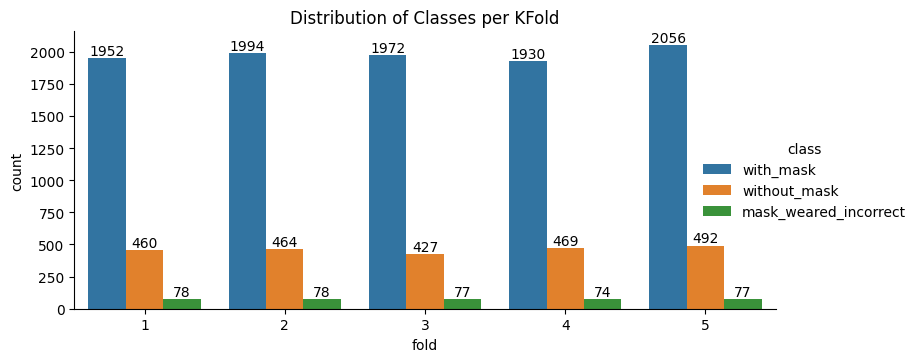

In [22]:
import seaborn as sns

g = ax = sns.catplot(x='fold', y='count', hue='class', data=df_folds, kind='bar', legend=True)
g.figure.set_size_inches(10, 4)
g.figure.subplots_adjust(top=0.81, right=0.86)
plt.title('Distribution of Classes per KFold')#, fontsize=20)

# extract the matplotlib axes_subplot objects from the FacetGrid
ax = g.facet_axis(0, 0)

# iterate through the axes containers
for c in ax.containers:
    labels = [int(v.get_height()) for v in c]
    ax.bar_label(c, labels=labels, label_type='edge')

df_folds

3. Ensure that the bounding box was put well on the images

In [23]:
def norm(img):
      img = np.array(img, dtype=np.float32)
      img -= img.min()
      img /= img.max()
      return img

def get_annotated_img(img, annt, is_pred=False):
      img = norm(np.array(np.transpose(img, (1, 2, 0)))) * 255.0 
            
      num_faces = len(annt['boxes'])
      for i in range(num_faces):
            box, cat = annt['boxes'][i], annt['labels'][i]
            if is_pred:
                  score = annt['scores'][i]
            xmin, ymin, xmax, ymax = np.array(box, dtype=np.int32)
            start_point = (xmin, ymin)
            end_point = (xmax, ymax)
      
            color = (0, 0, 0)
            if cat == 2:
                  color = (0, 255, 0) # green
            elif cat == 3:
                  color = (0, 0, 255) # blue
            elif cat == 1:
                  color = (255, 0, 0) # red
            thickness = 1
            img = cv2.rectangle(img, start_point, end_point, color, thickness)

            font = cv2.FONT_HERSHEY_SIMPLEX
            fontScale = 1 / 3
            if not is_pred:
                  img = cv2.putText(img, '{}'.format(trn_faceMasksData.classes[cat]), start_point, font, fontScale, color = (0, 0, 0), thickness=2)
                  img = cv2.putText(img, '{}'.format(trn_faceMasksData.classes[cat]), start_point, font, fontScale, color, thickness)
            else:
                  img = cv2.putText(img, '{:.2f}'.format(score), start_point, font, fontScale, color = (0, 0, 0), thickness=2)
                  img = cv2.putText(img, '{:.2f}'.format(score), start_point, font, fontScale, color, thickness)

        
        
      return img

def show_augmented_samples(dataloader, model=None):    
      samples, annotations = next(iter(dataloader))   #   get the first batch

      amount_samples = min(12, len(samples))          #   number of examples will be at most 12

      for i, (img, ant) in enumerate(zip(samples, annotations)):
            if i >= amount_samples:
                  break
            plt.figure(figsize=(8, 8))
      #         plt.subplot(amount_samples, 1, i + 1)        
            img = get_annotated_img(img, ant)
            plt.imshow(norm(img))
            plt.axis('off')
            plt.tight_layout()
            plt.show()

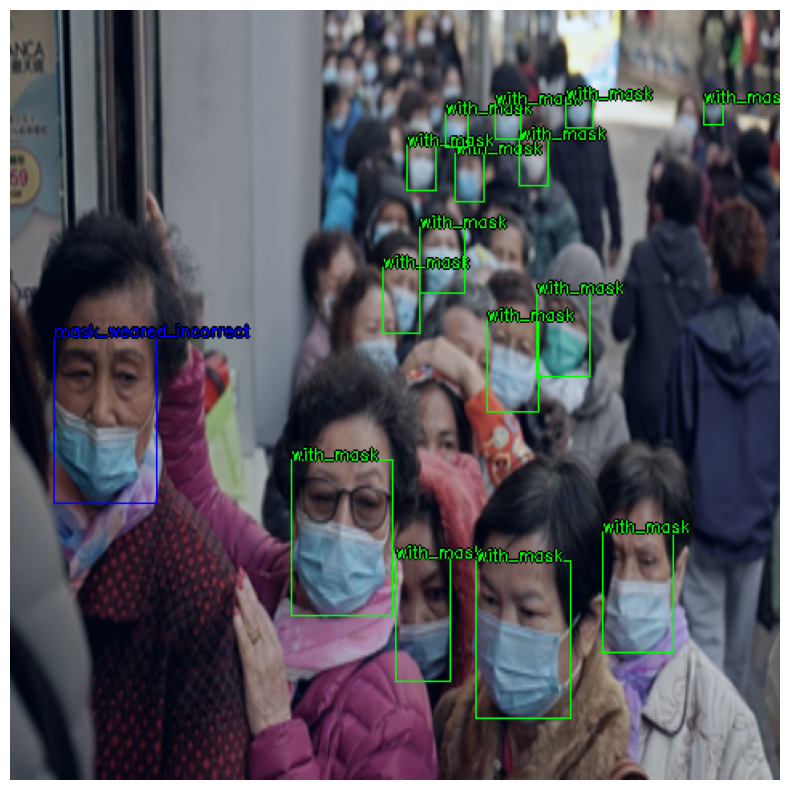

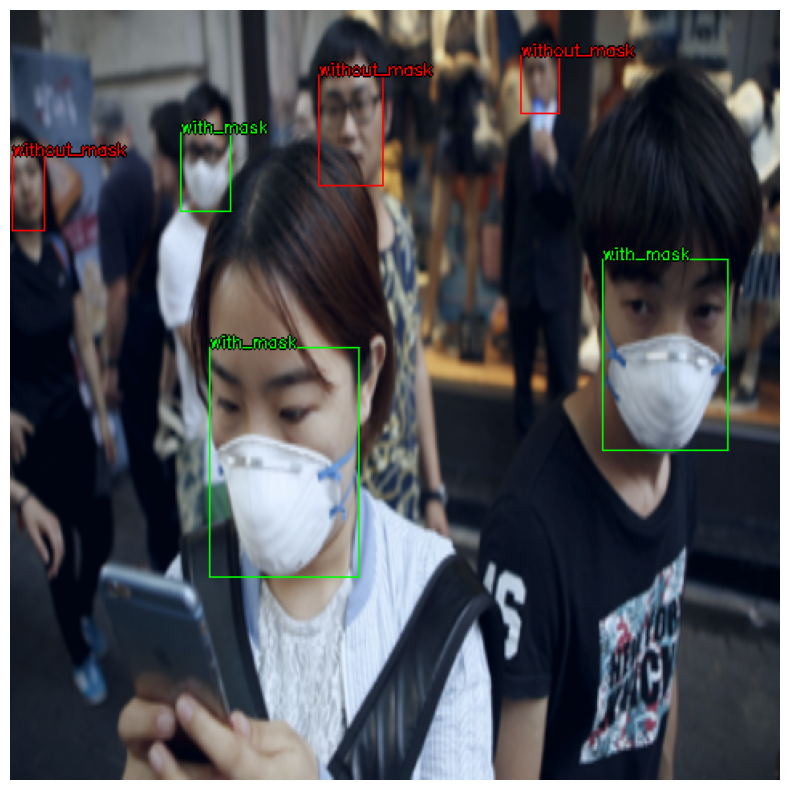

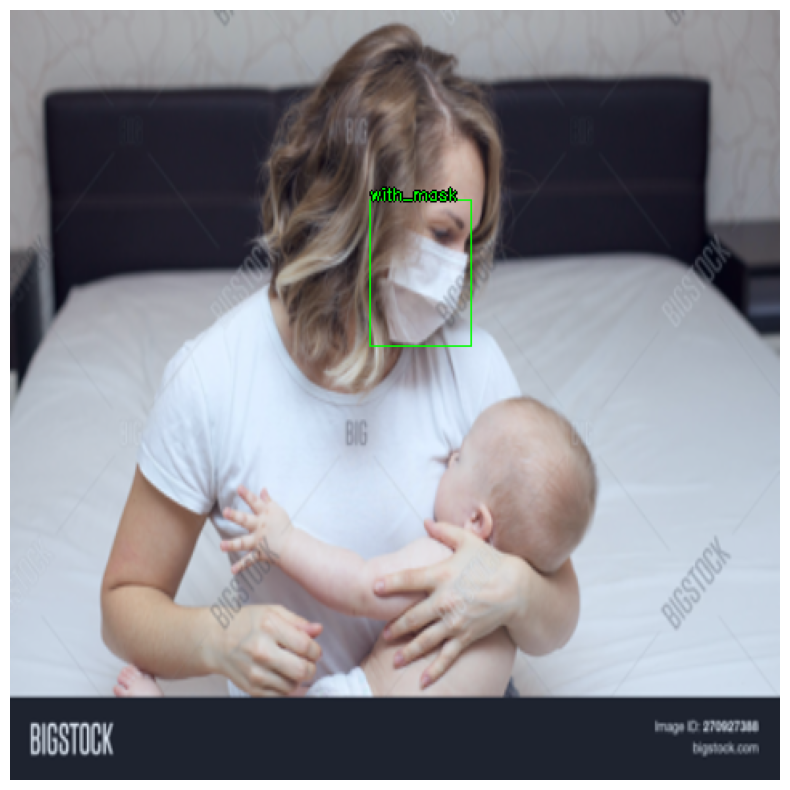

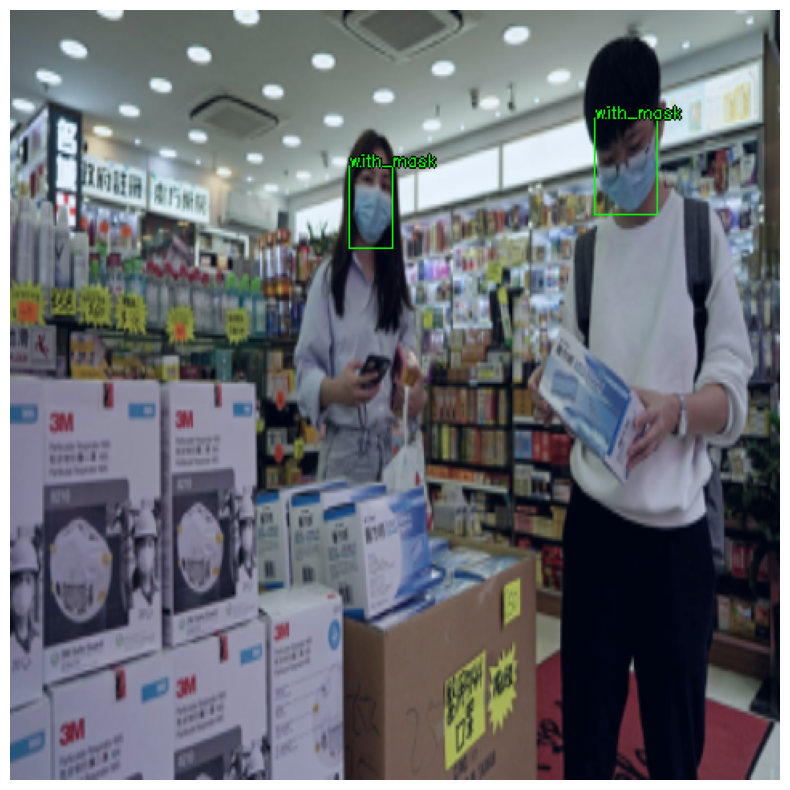

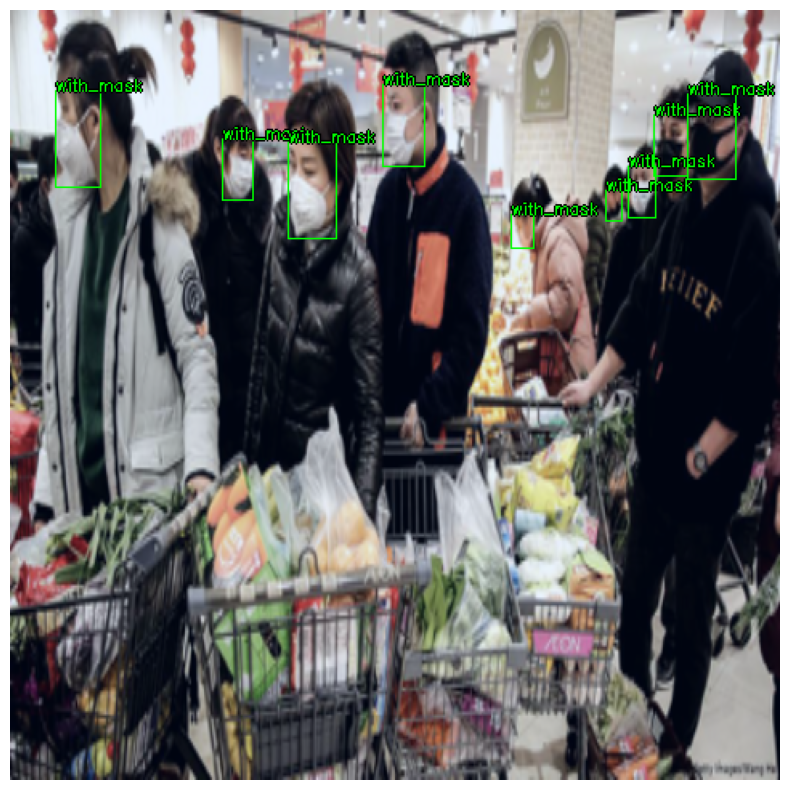

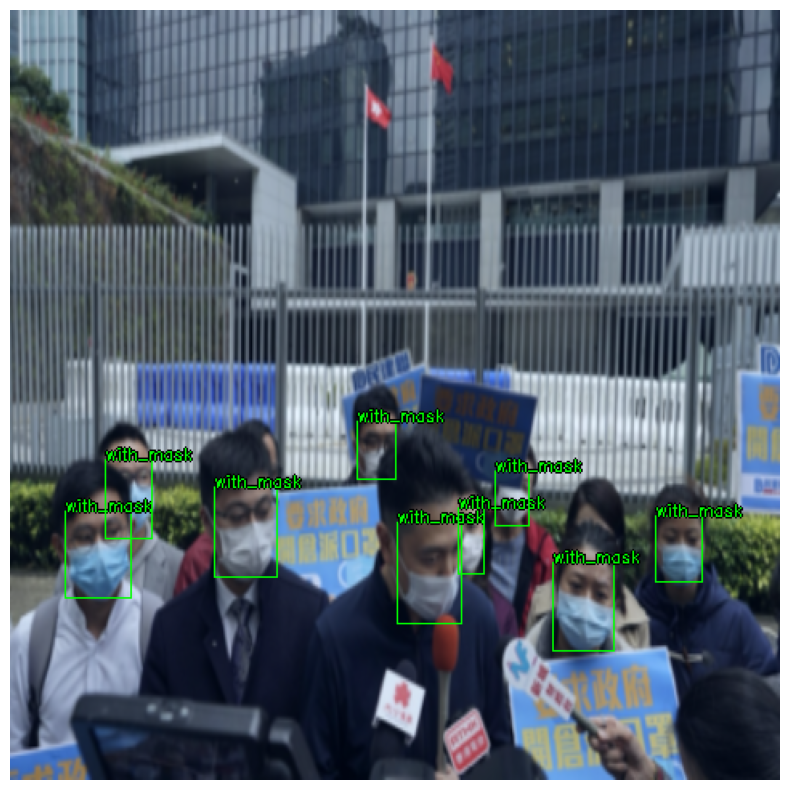

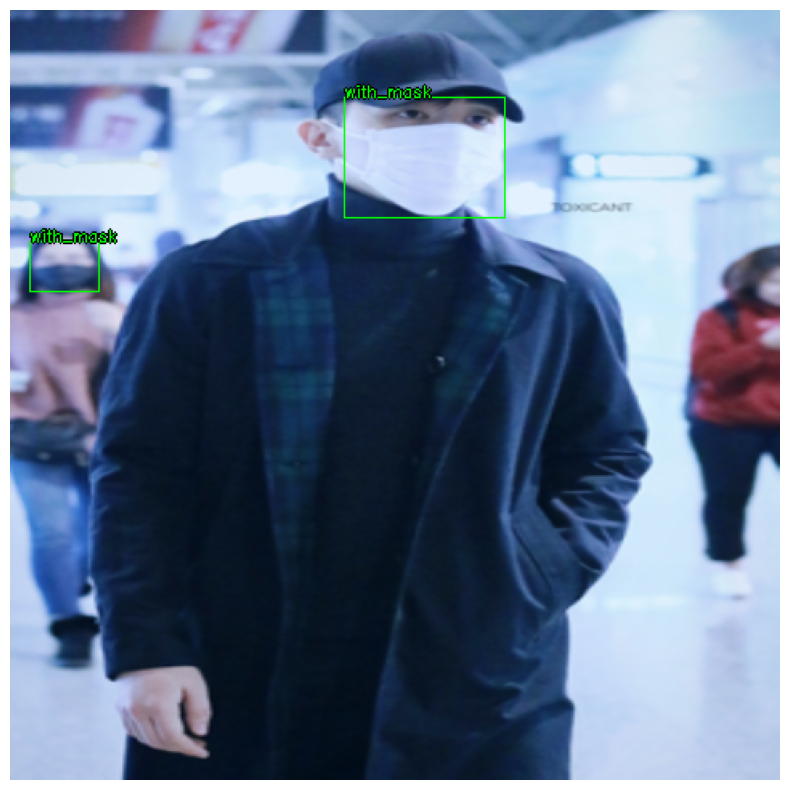

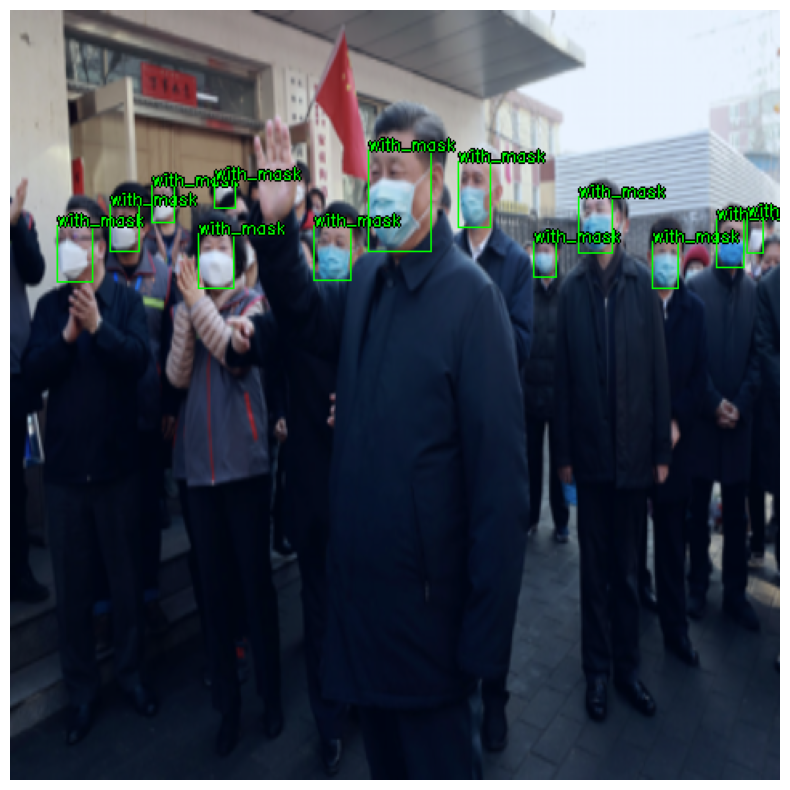

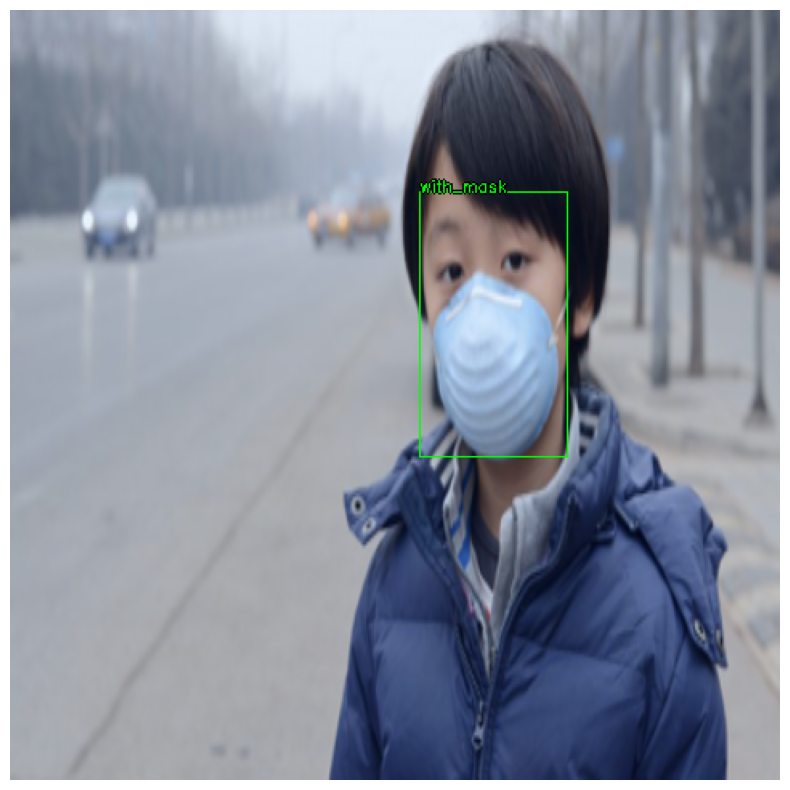

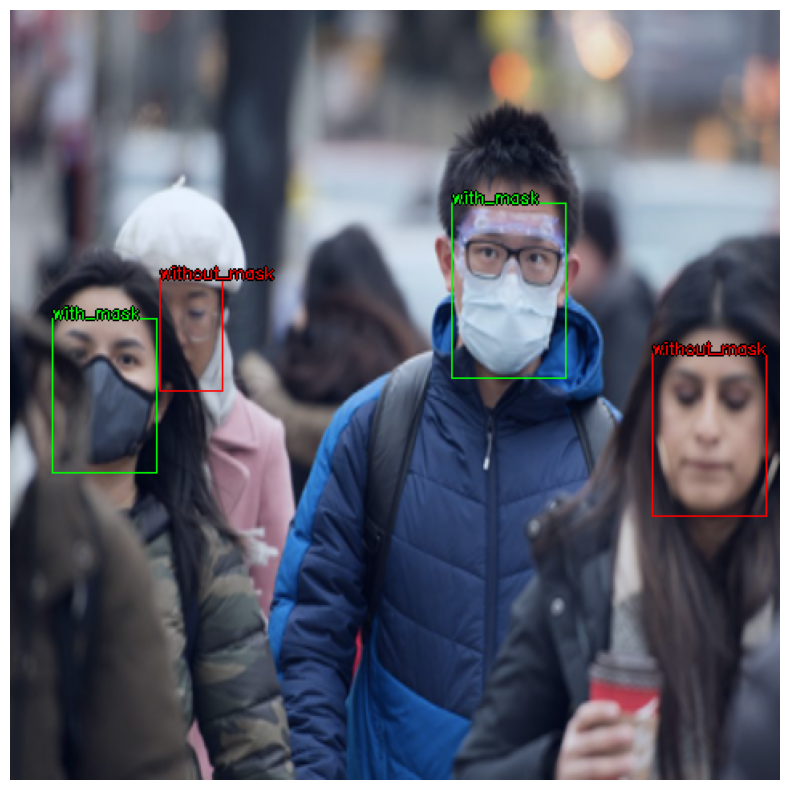

In [24]:
show_augmented_samples(test_loader)

#### No need to rerun this part!!!
4. Training the model 

In [25]:
from torchvision import models

In [26]:
def get_model(num_classes, pretrained=True):
      model = models.detection.fasterrcnn_resnet50_fpn(weights=models.detection.FasterRCNN_ResNet50_FPN_Weights.DEFAULT)
      in_features = model.roi_heads.box_predictor.cls_score.in_features
      model.roi_heads.box_predictor = models.detection.faster_rcnn.FastRCNNPredictor(in_features, num_classes)

      return model

In [24]:
model = get_model(num_classes=Config.num_classes, pretrained=Config.pretrained)

In [25]:
from tqdm import tqdm
import time

In [26]:
def train_epochs(model, loaders, optimizer, config, scheduler=None, prev_loss=float('inf')):
    
    device = config.device
    model = model.to(device).train()

    best_loss = prev_loss

    #   iterate epochs
    for epch in range(1, config.n_epochs + 1):
        print('Epoch {:3d} of {}:'.format(epch, config.n_epochs), flush=True)
             
        epoch_print = ''
        #   iterate phases
        for phase in ['train', 'valid']:

            with tqdm(total=len(loaders[phase]), desc=phase) as progress_bar:
                samples = 0
                epoch_losses = dict()
                accum_loss = 0.0

                #   iterate batches
                for imgs, annts in loaders[phase]:                      #   get next batch
                    imgs  = list(img.to(device) for img in imgs)    #   move images to GPU
                    annts = [{k: v.to(device) for k, v in t.items()} for t in annts]    #   move targets to GPU

                    batch_size = len(imgs)  
                    samples += batch_size

                    #   calculate batch losses
                    if phase == 'train':
                        loss_dict = model(imgs, annts)
                    else:
                        with torch.no_grad():
                            loss_dict = model(imgs, annts) 

                    losses = sum(loss for loss in loss_dict.values())       #   sum total of all batch loseses
                    if phase == 'train':
                        optimizer.zero_grad()
                        losses.backward()
                        optimizer.step()

                    accum_loss += losses.item()                             #   aggregate to get epoch loss at the end
                    for name, val in loss_dict.items():
                        if name in epoch_losses:
                            epoch_losses[name] += val
                        else:
                            epoch_losses[name] = val

                    del imgs, annts, loss_dict, losses
                    torch.cuda.empty_cache()
                    progress_bar.update(1)


            #   end of epoch, next section will run twice,
            #   once for training phase and once for validation phase of each epoch

            #   print to terminal and summary writers at end of each wpoch
            epoch_print += phase + ':\t'
            for key, val in epoch_losses.items():
                epoch_print += '{}={:.5f}\t'.format(key, val)
            epoch_print += 'total loss={:.5f}{}'.format(accum_loss, '\n' if phase == 'train' else '')

            del epoch_losses

        #   print outputs to the screen after done both training and validation phases of each epoch
        print(epoch_print, flush=True)
        scheduler.step()   
        
        # if the model perform better in this epoch, save it's parameters
        if accum_loss < best_loss:
            best_loss = accum_loss
        time.sleep(1)
    
    return best_loss

In [27]:
def trainMaskpred_model(model, x, y, config):
      '''Training the pretrained FasterRCNN model '''
      kfold = MultilabelStratifiedKFold(n_splits=config.n_folds, shuffle=True, random_state=config.seed)

      (y_annts, y_labels) = y
      prev_loss = float('inf')

      # iterate through folds
      for fold, (train_index, valid_index) in enumerate(kfold.split(x, y_labels), start=1):
            # get fold's data
            x_train, x_val = x[train_index], x[valid_index]
            y_train, y_val = y_annts[train_index], y_annts[valid_index]

            trainset = MaskedFaceTestDataset(x_train, y_train, config.imgs_path, config.msks_path,
                                             config.img_width, config.img_height, transform=train_trnf)
            validset = MaskedFaceTestDataset(x_val, y_val, config.imgs_path, config.msks_path,
                                             config.img_width, config.img_height, transform=test_trnf)
            trainLoader = DataLoader(trainset, batch_size=config.batch_size, shuffle=True,
                                     num_workers=config.num_workers, collate_fn=collate_fn, pin_memory=True)
            validLoader = DataLoader(validset, batch_size=config.batch_size, shuffle=False,
                                     num_workers=config.num_workers, collate_fn=collate_fn, pin_memory=True)
            
            dataloaders = {'train':trainLoader, 
                           'valid':validLoader}
            
            # define optimizer and scheduler
            params = [p for p in model.parameters() if p.requires_grad] # get optimizeable parameters
            optimizer = config.optimizer(params, **config.optimizer_dict)
            scheduler = config.scheduler(optimizer, **config.scheduler_dict)

            prev_loss = train_epochs(model, dataloaders, optimizer, config, scheduler, prev_loss)

            del x_train, x_val, y_train, y_val

            # save model's state each fold
            torch.save(model.state_dict(), './data/{}_fold_{}_MSKmodel.pth'.format(config.model_name, fold))

            

In [28]:
trainMaskpred_model(model, x_train, (y_train, l_train), Config)

Epoch   1 of 20:


train:   0%|          | 0/55 [00:00<?, ?it/s]

valid: 100%|██████████| 14/14 [00:13<00:00,  1.06it/s]

train:	loss_classifier=11.79240	loss_box_reg=12.12378	loss_objectness=8.01851	loss_rpn_box_reg=1.55939	total loss=33.49407
valid:	loss_classifier=2.26302	loss_box_reg=3.47657	loss_objectness=0.66559	loss_rpn_box_reg=0.38933	total loss=6.79450


Epoch   2 of 20:


valid: 100%|██████████| 14/14 [00:11<00:00,  1.21it/s]

train:	loss_classifier=8.51643	loss_box_reg=13.03098	loss_objectness=1.63307	loss_rpn_box_reg=1.01133	total loss=24.19182
valid:	loss_classifier=1.86317	loss_box_reg=3.00725	loss_objectness=0.54019	loss_rpn_box_reg=0.33627	total loss=5.74688


Epoch   3 of 20:


valid: 100%|██████████| 14/14 [00:09<00:00,  1.48it/s]

train:	loss_classifier=7.33079	loss_box_reg=11.67127	loss_objectness=1.07315	loss_rpn_box_reg=0.79694	total loss=20.87214
valid:	loss_classifier=1.70820	loss_box_reg=2.85049	loss_objectness=0.51813	loss_rpn_box_reg=0.33684	total loss=5.41367


Epoch   4 of 20:


valid: 100%|██████████| 14/14 [00:09<00:00,  1.53it/s]

train:	loss_classifier=6.44758	loss_box_reg=10.95924	loss_objectness=0.89699	loss_rpn_box_reg=0.71429	total loss=19.01811
valid:	loss_classifier=1.73671	loss_box_reg=2.80678	loss_objectness=0.48531	loss_rpn_box_reg=0.31334	total loss=5.34214


Epoch   5 of 20:


valid: 100%|██████████| 14/14 [00:09<00:00,  1.50it/s]

train:	loss_classifier=6.09250	loss_box_reg=10.61503	loss_objectness=0.78121	loss_rpn_box_reg=0.66946	total loss=18.15820
valid:	loss_classifier=1.47259	loss_box_reg=2.98212	loss_objectness=0.51476	loss_rpn_box_reg=0.28314	total loss=5.25260


Epoch   6 of 20:


valid: 100%|██████████| 14/14 [00:09<00:00,  1.50it/s]

train:	loss_classifier=5.68115	loss_box_reg=9.89105	loss_objectness=0.58818	loss_rpn_box_reg=0.60311	total loss=16.76348
valid:	loss_classifier=1.46934	loss_box_reg=2.43796	loss_objectness=0.55322	loss_rpn_box_reg=0.28783	total loss=4.74835


Epoch   7 of 20:


valid: 100%|██████████| 14/14 [00:13<00:00,  1.03it/s]

train:	loss_classifier=5.50342	loss_box_reg=9.66235	loss_objectness=0.59955	loss_rpn_box_reg=0.58354	total loss=16.34885
valid:	loss_classifier=1.48739	loss_box_reg=2.49125	loss_objectness=0.64344	loss_rpn_box_reg=0.29991	total loss=4.92200


Epoch   8 of 20:


valid: 100%|██████████| 14/14 [00:14<00:00,  1.05s/it]

train:	loss_classifier=5.59850	loss_box_reg=9.68871	loss_objectness=0.58149	loss_rpn_box_reg=0.61055	total loss=16.47925
valid:	loss_classifier=1.47982	loss_box_reg=2.50274	loss_objectness=0.64827	loss_rpn_box_reg=0.28896	total loss=4.91979


Epoch   9 of 20:


valid: 100%|██████████| 14/14 [00:14<00:00,  1.03s/it]

train:	loss_classifier=5.61129	loss_box_reg=9.62932	loss_objectness=0.58745	loss_rpn_box_reg=0.54396	total loss=16.37202
valid:	loss_classifier=1.48476	loss_box_reg=2.57598	loss_objectness=0.66887	loss_rpn_box_reg=0.29797	total loss=5.02759


Epoch  10 of 20:


valid: 100%|██████████| 14/14 [00:11<00:00,  1.22it/s]

train:	loss_classifier=5.27908	loss_box_reg=9.39231	loss_objectness=0.56994	loss_rpn_box_reg=0.56875	total loss=15.81007
valid:	loss_classifier=1.48012	loss_box_reg=2.52945	loss_objectness=0.62540	loss_rpn_box_reg=0.29278	total loss=4.92774


Epoch  11 of 20:


valid: 100%|██████████| 14/14 [00:09<00:00,  1.47it/s]

train:	loss_classifier=5.30014	loss_box_reg=9.47410	loss_objectness=0.55162	loss_rpn_box_reg=0.56313	total loss=15.88899
valid:	loss_classifier=1.47629	loss_box_reg=2.47271	loss_objectness=0.63084	loss_rpn_box_reg=0.28259	total loss=4.86242


Epoch  12 of 20:


valid: 100%|██████████| 14/14 [00:12<00:00,  1.13it/s]

train:	loss_classifier=5.43740	loss_box_reg=9.33715	loss_objectness=0.53268	loss_rpn_box_reg=0.55623	total loss=15.86346
valid:	loss_classifier=1.48295	loss_box_reg=2.48710	loss_objectness=0.63885	loss_rpn_box_reg=0.28262	total loss=4.89152


Epoch  13 of 20:


valid: 100%|██████████| 14/14 [00:11<00:00,  1.23it/s]

train:	loss_classifier=5.39262	loss_box_reg=9.43800	loss_objectness=0.55124	loss_rpn_box_reg=0.54563	total loss=15.92749
valid:	loss_classifier=1.46048	loss_box_reg=2.48165	loss_objectness=0.63360	loss_rpn_box_reg=0.27776	total loss=4.85350


Epoch  14 of 20:


valid: 100%|██████████| 14/14 [00:09<00:00,  1.48it/s]

train:	loss_classifier=5.28021	loss_box_reg=9.34089	loss_objectness=0.55726	loss_rpn_box_reg=0.57430	total loss=15.75266
valid:	loss_classifier=1.45009	loss_box_reg=2.47084	loss_objectness=0.65363	loss_rpn_box_reg=0.28645	total loss=4.86101


Epoch  15 of 20:


valid: 100%|██████████| 14/14 [00:13<00:00,  1.06it/s]

train:	loss_classifier=5.39647	loss_box_reg=9.42713	loss_objectness=0.54946	loss_rpn_box_reg=0.58039	total loss=15.95345
valid:	loss_classifier=1.48426	loss_box_reg=2.48944	loss_objectness=0.64611	loss_rpn_box_reg=0.28286	total loss=4.90268


Epoch  16 of 20:


valid: 100%|██████████| 14/14 [00:11<00:00,  1.24it/s]

train:	loss_classifier=5.08781	loss_box_reg=9.30841	loss_objectness=0.56585	loss_rpn_box_reg=0.57672	total loss=15.53879
valid:	loss_classifier=1.47564	loss_box_reg=2.48984	loss_objectness=0.64159	loss_rpn_box_reg=0.28549	total loss=4.89256


Epoch  17 of 20:


valid: 100%|██████████| 14/14 [00:13<00:00,  1.01it/s]

train:	loss_classifier=5.36931	loss_box_reg=9.38149	loss_objectness=0.53703	loss_rpn_box_reg=0.54088	total loss=15.82871
valid:	loss_classifier=1.44129	loss_box_reg=2.49922	loss_objectness=0.64086	loss_rpn_box_reg=0.27570	total loss=4.85708


Epoch  18 of 20:


valid: 100%|██████████| 14/14 [00:13<00:00,  1.03it/s]

train:	loss_classifier=5.37445	loss_box_reg=9.42138	loss_objectness=0.56726	loss_rpn_box_reg=0.55386	total loss=15.91695
valid:	loss_classifier=1.47029	loss_box_reg=2.48475	loss_objectness=0.64012	loss_rpn_box_reg=0.28090	total loss=4.87605


Epoch  19 of 20:


valid: 100%|██████████| 14/14 [00:15<00:00,  1.09s/it]

train:	loss_classifier=5.40578	loss_box_reg=9.43775	loss_objectness=0.56082	loss_rpn_box_reg=0.54772	total loss=15.95208
valid:	loss_classifier=1.46798	loss_box_reg=2.49937	loss_objectness=0.62154	loss_rpn_box_reg=0.28277	total loss=4.87166


Epoch  20 of 20:


valid: 100%|██████████| 14/14 [00:09<00:00,  1.50it/s]

train:	loss_classifier=5.32166	loss_box_reg=9.34996	loss_objectness=0.51838	loss_rpn_box_reg=0.53602	total loss=15.72602
valid:	loss_classifier=1.45433	loss_box_reg=2.49276	loss_objectness=0.68976	loss_rpn_box_reg=0.28392	total loss=4.92077


Epoch   1 of 20:


valid: 100%|██████████| 14/14 [00:09<00:00,  1.41it/s]

train:	loss_classifier=5.77964	loss_box_reg=10.43685	loss_objectness=0.94744	loss_rpn_box_reg=0.76948	total loss=17.93341
valid:	loss_classifier=1.16378	loss_box_reg=2.10450	loss_objectness=0.16255	loss_rpn_box_reg=0.22336	total loss=3.65419


Epoch   2 of 20:


valid: 100%|██████████| 14/14 [00:12<00:00,  1.13it/s]

train:	loss_classifier=5.36557	loss_box_reg=9.87020	loss_objectness=0.87054	loss_rpn_box_reg=0.73723	total loss=16.84353
valid:	loss_classifier=1.24173	loss_box_reg=2.05680	loss_objectness=0.21577	loss_rpn_box_reg=0.15139	total loss=3.66569


Epoch   3 of 20:


valid: 100%|██████████| 14/14 [00:11<00:00,  1.24it/s]

train:	loss_classifier=5.63520	loss_box_reg=10.03519	loss_objectness=0.67999	loss_rpn_box_reg=0.68256	total loss=17.03295
valid:	loss_classifier=1.31298	loss_box_reg=2.16174	loss_objectness=0.15427	loss_rpn_box_reg=0.16224	total loss=3.79124


Epoch   4 of 20:


valid: 100%|██████████| 14/14 [00:09<00:00,  1.42it/s]

train:	loss_classifier=5.21750	loss_box_reg=9.48905	loss_objectness=0.57677	loss_rpn_box_reg=0.61250	total loss=15.89582
valid:	loss_classifier=1.19498	loss_box_reg=2.28583	loss_objectness=0.11907	loss_rpn_box_reg=0.15999	total loss=3.75988


Epoch   5 of 20:


valid: 100%|██████████| 14/14 [00:11<00:00,  1.18it/s]

train:	loss_classifier=4.87688	loss_box_reg=9.45136	loss_objectness=0.52158	loss_rpn_box_reg=0.60598	total loss=15.45580
valid:	loss_classifier=1.16079	loss_box_reg=2.27838	loss_objectness=0.10905	loss_rpn_box_reg=0.15055	total loss=3.69877


Epoch   6 of 20:


valid: 100%|██████████| 14/14 [00:10<00:00,  1.29it/s]

train:	loss_classifier=4.66093	loss_box_reg=8.82457	loss_objectness=0.45408	loss_rpn_box_reg=0.55687	total loss=14.49644
valid:	loss_classifier=1.13858	loss_box_reg=2.01957	loss_objectness=0.12293	loss_rpn_box_reg=0.14090	total loss=3.42197


Epoch   7 of 20:


valid: 100%|██████████| 14/14 [00:12<00:00,  1.15it/s]

train:	loss_classifier=4.54149	loss_box_reg=8.63655	loss_objectness=0.47930	loss_rpn_box_reg=0.59041	total loss=14.24775
valid:	loss_classifier=1.16986	loss_box_reg=2.01460	loss_objectness=0.09823	loss_rpn_box_reg=0.13467	total loss=3.41736


Epoch   8 of 20:


valid: 100%|██████████| 14/14 [00:11<00:00,  1.20it/s]

train:	loss_classifier=4.35605	loss_box_reg=8.38062	loss_objectness=0.36013	loss_rpn_box_reg=0.50013	total loss=13.59694
valid:	loss_classifier=1.17607	loss_box_reg=2.00128	loss_objectness=0.10781	loss_rpn_box_reg=0.13457	total loss=3.41973


Epoch   9 of 20:


valid: 100%|██████████| 14/14 [00:09<00:00,  1.42it/s]

train:	loss_classifier=4.58969	loss_box_reg=8.45737	loss_objectness=0.40613	loss_rpn_box_reg=0.50873	total loss=13.96192
valid:	loss_classifier=1.17874	loss_box_reg=2.03314	loss_objectness=0.11487	loss_rpn_box_reg=0.13579	total loss=3.46254


Epoch  10 of 20:


valid: 100%|██████████| 14/14 [00:12<00:00,  1.16it/s]

train:	loss_classifier=4.60547	loss_box_reg=8.50986	loss_objectness=0.44185	loss_rpn_box_reg=0.49795	total loss=14.05514
valid:	loss_classifier=1.14153	loss_box_reg=2.00507	loss_objectness=0.10891	loss_rpn_box_reg=0.13531	total loss=3.39083


Epoch  11 of 20:


valid: 100%|██████████| 14/14 [00:09<00:00,  1.42it/s]

train:	loss_classifier=4.40680	loss_box_reg=8.06856	loss_objectness=0.40225	loss_rpn_box_reg=0.48052	total loss=13.35812
valid:	loss_classifier=1.13584	loss_box_reg=1.99267	loss_objectness=0.09971	loss_rpn_box_reg=0.13603	total loss=3.36425


Epoch  12 of 20:


valid: 100%|██████████| 14/14 [00:11<00:00,  1.25it/s]

train:	loss_classifier=4.30667	loss_box_reg=8.10341	loss_objectness=0.40520	loss_rpn_box_reg=0.51166	total loss=13.32694
valid:	loss_classifier=1.11951	loss_box_reg=1.98419	loss_objectness=0.09803	loss_rpn_box_reg=0.13390	total loss=3.33563


Epoch  13 of 20:


valid: 100%|██████████| 14/14 [00:13<00:00,  1.05it/s]

train:	loss_classifier=4.37221	loss_box_reg=8.38885	loss_objectness=0.34597	loss_rpn_box_reg=0.47023	total loss=13.57726
valid:	loss_classifier=1.15384	loss_box_reg=2.00706	loss_objectness=0.10081	loss_rpn_box_reg=0.13537	total loss=3.39708


Epoch  14 of 20:


valid: 100%|██████████| 14/14 [00:11<00:00,  1.24it/s]

train:	loss_classifier=4.48016	loss_box_reg=8.52242	loss_objectness=0.38583	loss_rpn_box_reg=0.46164	total loss=13.85005
valid:	loss_classifier=1.17964	loss_box_reg=2.01330	loss_objectness=0.11525	loss_rpn_box_reg=0.13493	total loss=3.44312


Epoch  15 of 20:


valid: 100%|██████████| 14/14 [00:12<00:00,  1.10it/s]

train:	loss_classifier=4.33009	loss_box_reg=8.23717	loss_objectness=0.39069	loss_rpn_box_reg=0.47752	total loss=13.43547
valid:	loss_classifier=1.13914	loss_box_reg=1.98719	loss_objectness=0.11582	loss_rpn_box_reg=0.13482	total loss=3.37696


Epoch  16 of 20:


valid: 100%|██████████| 14/14 [00:10<00:00,  1.31it/s]

train:	loss_classifier=4.42609	loss_box_reg=8.40051	loss_objectness=0.45455	loss_rpn_box_reg=0.52109	total loss=13.80224
valid:	loss_classifier=1.15306	loss_box_reg=2.00945	loss_objectness=0.10900	loss_rpn_box_reg=0.13489	total loss=3.40640


Epoch  17 of 20:


valid: 100%|██████████| 14/14 [00:12<00:00,  1.09it/s]

train:	loss_classifier=4.19743	loss_box_reg=8.18163	loss_objectness=0.34453	loss_rpn_box_reg=0.49222	total loss=13.21582
valid:	loss_classifier=1.15101	loss_box_reg=2.00754	loss_objectness=0.10039	loss_rpn_box_reg=0.13539	total loss=3.39433


Epoch  18 of 20:


valid: 100%|██████████| 14/14 [00:11<00:00,  1.26it/s]

train:	loss_classifier=4.27093	loss_box_reg=8.31628	loss_objectness=0.36755	loss_rpn_box_reg=0.50971	total loss=13.46447
valid:	loss_classifier=1.15762	loss_box_reg=2.01000	loss_objectness=0.10478	loss_rpn_box_reg=0.13528	total loss=3.40767


Epoch  19 of 20:


valid: 100%|██████████| 14/14 [00:11<00:00,  1.17it/s]

train:	loss_classifier=4.53774	loss_box_reg=8.34643	loss_objectness=0.41588	loss_rpn_box_reg=0.52509	total loss=13.82514
valid:	loss_classifier=1.15286	loss_box_reg=2.01347	loss_objectness=0.10958	loss_rpn_box_reg=0.13453	total loss=3.41044


Epoch  20 of 20:


valid: 100%|██████████| 14/14 [00:12<00:00,  1.14it/s]

train:	loss_classifier=4.46853	loss_box_reg=8.26320	loss_objectness=0.39808	loss_rpn_box_reg=0.48235	total loss=13.61216
valid:	loss_classifier=1.12423	loss_box_reg=2.00129	loss_objectness=0.10381	loss_rpn_box_reg=0.13433	total loss=3.36365


Epoch   1 of 20:


valid: 100%|██████████| 14/14 [00:11<00:00,  1.25it/s]

train:	loss_classifier=5.04219	loss_box_reg=9.07300	loss_objectness=0.54049	loss_rpn_box_reg=0.56998	total loss=15.22566
valid:	loss_classifier=1.02597	loss_box_reg=1.84095	loss_objectness=0.11736	loss_rpn_box_reg=0.14585	total loss=3.13013


Epoch   2 of 20:


valid: 100%|██████████| 14/14 [00:09<00:00,  1.42it/s]

train:	loss_classifier=4.89630	loss_box_reg=8.89693	loss_objectness=0.48488	loss_rpn_box_reg=0.56594	total loss=14.84405
valid:	loss_classifier=1.12385	loss_box_reg=2.43038	loss_objectness=0.09599	loss_rpn_box_reg=0.18452	total loss=3.83474


Epoch   3 of 20:


valid: 100%|██████████| 14/14 [00:12<00:00,  1.14it/s]

train:	loss_classifier=4.73272	loss_box_reg=9.45457	loss_objectness=0.40137	loss_rpn_box_reg=0.53608	total loss=15.12472
valid:	loss_classifier=0.93085	loss_box_reg=1.87619	loss_objectness=0.07565	loss_rpn_box_reg=0.14663	total loss=3.02932


Epoch   4 of 20:


valid: 100%|██████████| 14/14 [00:10<00:00,  1.35it/s]

train:	loss_classifier=4.66175	loss_box_reg=8.99205	loss_objectness=0.38320	loss_rpn_box_reg=0.52890	total loss=14.56589
valid:	loss_classifier=0.97110	loss_box_reg=1.91854	loss_objectness=0.07455	loss_rpn_box_reg=0.15515	total loss=3.11933


Epoch   5 of 20:


valid: 100%|██████████| 14/14 [00:11<00:00,  1.20it/s]

train:	loss_classifier=4.55524	loss_box_reg=8.81903	loss_objectness=0.45118	loss_rpn_box_reg=0.53987	total loss=14.36533
valid:	loss_classifier=0.98305	loss_box_reg=2.05182	loss_objectness=0.07633	loss_rpn_box_reg=0.14167	total loss=3.25287


Epoch   6 of 20:


valid: 100%|██████████| 14/14 [00:11<00:00,  1.25it/s]

train:	loss_classifier=4.26778	loss_box_reg=8.24974	loss_objectness=0.35868	loss_rpn_box_reg=0.46265	total loss=13.33885
valid:	loss_classifier=0.92607	loss_box_reg=1.80473	loss_objectness=0.06934	loss_rpn_box_reg=0.12771	total loss=2.92785


Epoch   7 of 20:


valid: 100%|██████████| 14/14 [00:09<00:00,  1.41it/s]

train:	loss_classifier=3.92582	loss_box_reg=7.60791	loss_objectness=0.29768	loss_rpn_box_reg=0.41810	total loss=12.24951
valid:	loss_classifier=0.86911	loss_box_reg=1.73445	loss_objectness=0.07226	loss_rpn_box_reg=0.12045	total loss=2.79626


Epoch   8 of 20:


valid: 100%|██████████| 14/14 [00:11<00:00,  1.20it/s]

train:	loss_classifier=3.94704	loss_box_reg=7.73915	loss_objectness=0.33793	loss_rpn_box_reg=0.41509	total loss=12.43921
valid:	loss_classifier=0.88884	loss_box_reg=1.74191	loss_objectness=0.06244	loss_rpn_box_reg=0.12135	total loss=2.81455


Epoch   9 of 20:


valid: 100%|██████████| 14/14 [00:09<00:00,  1.42it/s]

train:	loss_classifier=3.75692	loss_box_reg=7.69192	loss_objectness=0.30212	loss_rpn_box_reg=0.44281	total loss=12.19376
valid:	loss_classifier=0.90969	loss_box_reg=1.82840	loss_objectness=0.07624	loss_rpn_box_reg=0.12289	total loss=2.93722


Epoch  10 of 20:


valid: 100%|██████████| 14/14 [00:10<00:00,  1.39it/s]

train:	loss_classifier=3.91675	loss_box_reg=7.75327	loss_objectness=0.31537	loss_rpn_box_reg=0.43672	total loss=12.42211
valid:	loss_classifier=0.88753	loss_box_reg=1.77052	loss_objectness=0.08188	loss_rpn_box_reg=0.11874	total loss=2.85868


Epoch  11 of 20:


valid: 100%|██████████| 14/14 [00:12<00:00,  1.16it/s]

train:	loss_classifier=4.05067	loss_box_reg=7.82955	loss_objectness=0.31271	loss_rpn_box_reg=0.43174	total loss=12.62467
valid:	loss_classifier=0.86675	loss_box_reg=1.76137	loss_objectness=0.07239	loss_rpn_box_reg=0.12130	total loss=2.82181


Epoch  12 of 20:


valid: 100%|██████████| 14/14 [00:11<00:00,  1.23it/s]

train:	loss_classifier=3.94021	loss_box_reg=7.64202	loss_objectness=0.32409	loss_rpn_box_reg=0.41566	total loss=12.32198
valid:	loss_classifier=0.90624	loss_box_reg=1.79427	loss_objectness=0.07419	loss_rpn_box_reg=0.12232	total loss=2.89702


Epoch  13 of 20:


valid: 100%|██████████| 14/14 [00:12<00:00,  1.14it/s]

train:	loss_classifier=3.86322	loss_box_reg=7.58873	loss_objectness=0.30285	loss_rpn_box_reg=0.42802	total loss=12.18282
valid:	loss_classifier=0.88086	loss_box_reg=1.77277	loss_objectness=0.07009	loss_rpn_box_reg=0.12330	total loss=2.84701


Epoch  14 of 20:


valid: 100%|██████████| 14/14 [00:09<00:00,  1.49it/s]

train:	loss_classifier=3.83388	loss_box_reg=7.63432	loss_objectness=0.30670	loss_rpn_box_reg=0.40733	total loss=12.18223
valid:	loss_classifier=0.89248	loss_box_reg=1.80313	loss_objectness=0.08185	loss_rpn_box_reg=0.12551	total loss=2.90297


Epoch  15 of 20:


valid: 100%|██████████| 14/14 [00:12<00:00,  1.16it/s]

train:	loss_classifier=4.01608	loss_box_reg=7.87933	loss_objectness=0.32442	loss_rpn_box_reg=0.40075	total loss=12.62058
valid:	loss_classifier=0.89466	loss_box_reg=1.77539	loss_objectness=0.08081	loss_rpn_box_reg=0.12146	total loss=2.87232


Epoch  16 of 20:


valid: 100%|██████████| 14/14 [00:11<00:00,  1.18it/s]

train:	loss_classifier=3.93070	loss_box_reg=7.57657	loss_objectness=0.31844	loss_rpn_box_reg=0.39820	total loss=12.22391
valid:	loss_classifier=0.88001	loss_box_reg=1.77397	loss_objectness=0.07015	loss_rpn_box_reg=0.12268	total loss=2.84680


Epoch  17 of 20:


valid: 100%|██████████| 14/14 [00:11<00:00,  1.17it/s]

train:	loss_classifier=4.04768	loss_box_reg=7.65672	loss_objectness=0.25594	loss_rpn_box_reg=0.41213	total loss=12.37248
valid:	loss_classifier=0.90810	loss_box_reg=1.77646	loss_objectness=0.06926	loss_rpn_box_reg=0.12054	total loss=2.87437


Epoch  18 of 20:


valid: 100%|██████████| 14/14 [00:10<00:00,  1.32it/s]

train:	loss_classifier=3.80657	loss_box_reg=7.53668	loss_objectness=0.32558	loss_rpn_box_reg=0.39602	total loss=12.06485
valid:	loss_classifier=0.87088	loss_box_reg=1.77141	loss_objectness=0.06881	loss_rpn_box_reg=0.12102	total loss=2.83212


Epoch  19 of 20:


valid: 100%|██████████| 14/14 [00:10<00:00,  1.37it/s]

train:	loss_classifier=4.08955	loss_box_reg=7.72002	loss_objectness=0.32378	loss_rpn_box_reg=0.39070	total loss=12.52405
valid:	loss_classifier=0.90648	loss_box_reg=1.77136	loss_objectness=0.06772	loss_rpn_box_reg=0.12299	total loss=2.86855


Epoch  20 of 20:


valid: 100%|██████████| 14/14 [00:10<00:00,  1.35it/s]

train:	loss_classifier=3.90199	loss_box_reg=7.79131	loss_objectness=0.28632	loss_rpn_box_reg=0.41954	total loss=12.39917
valid:	loss_classifier=0.88291	loss_box_reg=1.78247	loss_objectness=0.06704	loss_rpn_box_reg=0.12073	total loss=2.85315


Epoch   1 of 20:


valid: 100%|██████████| 14/14 [00:13<00:00,  1.00it/s]

train:	loss_classifier=4.22533	loss_box_reg=8.19331	loss_objectness=0.42079	loss_rpn_box_reg=0.50377	total loss=13.34319
valid:	loss_classifier=0.83175	loss_box_reg=1.75196	loss_objectness=0.06837	loss_rpn_box_reg=0.11999	total loss=2.77207


Epoch   2 of 20:


valid: 100%|██████████| 14/14 [00:13<00:00,  1.01it/s]

train:	loss_classifier=4.27849	loss_box_reg=8.64183	loss_objectness=0.33259	loss_rpn_box_reg=0.51547	total loss=13.76838
valid:	loss_classifier=0.84502	loss_box_reg=2.25523	loss_objectness=0.05630	loss_rpn_box_reg=0.13083	total loss=3.28737


Epoch   3 of 20:


valid: 100%|██████████| 14/14 [00:13<00:00,  1.01it/s]

train:	loss_classifier=4.17948	loss_box_reg=8.34017	loss_objectness=0.34575	loss_rpn_box_reg=0.48919	total loss=13.35459
valid:	loss_classifier=0.85778	loss_box_reg=2.16366	loss_objectness=0.06248	loss_rpn_box_reg=0.14818	total loss=3.23211


Epoch   4 of 20:


valid: 100%|██████████| 14/14 [00:13<00:00,  1.03it/s]

train:	loss_classifier=4.01155	loss_box_reg=8.06620	loss_objectness=0.34088	loss_rpn_box_reg=0.46544	total loss=12.88407
valid:	loss_classifier=0.82845	loss_box_reg=1.81386	loss_objectness=0.05707	loss_rpn_box_reg=0.12610	total loss=2.82549


Epoch   5 of 20:


valid: 100%|██████████| 14/14 [00:13<00:00,  1.02it/s]

train:	loss_classifier=3.80561	loss_box_reg=7.81041	loss_objectness=0.32064	loss_rpn_box_reg=0.45071	total loss=12.38737
valid:	loss_classifier=0.83321	loss_box_reg=2.04950	loss_objectness=0.06110	loss_rpn_box_reg=0.13992	total loss=3.08374


Epoch   6 of 20:


valid: 100%|██████████| 14/14 [00:13<00:00,  1.00it/s]

train:	loss_classifier=3.76424	loss_box_reg=7.56462	loss_objectness=0.31450	loss_rpn_box_reg=0.39975	total loss=12.04310
valid:	loss_classifier=0.74622	loss_box_reg=1.75883	loss_objectness=0.05676	loss_rpn_box_reg=0.12054	total loss=2.68236


Epoch   7 of 20:


valid: 100%|██████████| 14/14 [00:13<00:00,  1.03it/s]

train:	loss_classifier=3.47471	loss_box_reg=7.07058	loss_objectness=0.27578	loss_rpn_box_reg=0.39831	total loss=11.21938
valid:	loss_classifier=0.74571	loss_box_reg=1.76534	loss_objectness=0.05899	loss_rpn_box_reg=0.11665	total loss=2.68669


Epoch   8 of 20:


valid: 100%|██████████| 14/14 [00:13<00:00,  1.02it/s]

train:	loss_classifier=3.65295	loss_box_reg=7.06248	loss_objectness=0.30927	loss_rpn_box_reg=0.41221	total loss=11.43691
valid:	loss_classifier=0.74715	loss_box_reg=1.72515	loss_objectness=0.05132	loss_rpn_box_reg=0.11787	total loss=2.64148


Epoch   9 of 20:


valid: 100%|██████████| 14/14 [00:14<00:00,  1.01s/it]

train:	loss_classifier=3.64802	loss_box_reg=7.04268	loss_objectness=0.28680	loss_rpn_box_reg=0.39403	total loss=11.37152
valid:	loss_classifier=0.72509	loss_box_reg=1.74844	loss_objectness=0.04952	loss_rpn_box_reg=0.11694	total loss=2.64000


Epoch  10 of 20:


valid: 100%|██████████| 14/14 [00:12<00:00,  1.08it/s]

train:	loss_classifier=3.60594	loss_box_reg=6.98535	loss_objectness=0.26498	loss_rpn_box_reg=0.38068	total loss=11.23695
valid:	loss_classifier=0.75312	loss_box_reg=1.77941	loss_objectness=0.04795	loss_rpn_box_reg=0.11561	total loss=2.69609


Epoch  11 of 20:


valid: 100%|██████████| 14/14 [00:13<00:00,  1.03it/s]

train:	loss_classifier=3.54581	loss_box_reg=6.93575	loss_objectness=0.24708	loss_rpn_box_reg=0.37635	total loss=11.10499
valid:	loss_classifier=0.75006	loss_box_reg=1.73541	loss_objectness=0.05894	loss_rpn_box_reg=0.11748	total loss=2.66190


Epoch  12 of 20:


valid: 100%|██████████| 14/14 [00:14<00:00,  1.02s/it]

train:	loss_classifier=3.46471	loss_box_reg=6.92233	loss_objectness=0.29935	loss_rpn_box_reg=0.37336	total loss=11.05975
valid:	loss_classifier=0.72868	loss_box_reg=1.72374	loss_objectness=0.06194	loss_rpn_box_reg=0.11583	total loss=2.63020


Epoch  13 of 20:


valid: 100%|██████████| 14/14 [00:13<00:00,  1.01it/s]

train:	loss_classifier=3.45697	loss_box_reg=6.89150	loss_objectness=0.25577	loss_rpn_box_reg=0.38934	total loss=10.99359
valid:	loss_classifier=0.74578	loss_box_reg=1.73514	loss_objectness=0.05706	loss_rpn_box_reg=0.11398	total loss=2.65195


Epoch  14 of 20:


valid: 100%|██████████| 14/14 [00:14<00:00,  1.04s/it]

train:	loss_classifier=3.42472	loss_box_reg=6.94069	loss_objectness=0.31693	loss_rpn_box_reg=0.38727	total loss=11.06961
valid:	loss_classifier=0.72743	loss_box_reg=1.71725	loss_objectness=0.05116	loss_rpn_box_reg=0.11418	total loss=2.61003


Epoch  15 of 20:


valid: 100%|██████████| 14/14 [00:13<00:00,  1.08it/s]

train:	loss_classifier=3.21417	loss_box_reg=6.78533	loss_objectness=0.23053	loss_rpn_box_reg=0.37486	total loss=10.60490
valid:	loss_classifier=0.74407	loss_box_reg=1.70174	loss_objectness=0.06181	loss_rpn_box_reg=0.11300	total loss=2.62061


Epoch  16 of 20:


valid: 100%|██████████| 14/14 [00:13<00:00,  1.01it/s]

train:	loss_classifier=3.39122	loss_box_reg=6.95390	loss_objectness=0.25461	loss_rpn_box_reg=0.39359	total loss=10.99332
valid:	loss_classifier=0.72650	loss_box_reg=1.70006	loss_objectness=0.04353	loss_rpn_box_reg=0.11306	total loss=2.58316


Epoch  17 of 20:


valid: 100%|██████████| 14/14 [00:11<00:00,  1.21it/s]

train:	loss_classifier=3.35828	loss_box_reg=6.73161	loss_objectness=0.26276	loss_rpn_box_reg=0.37884	total loss=10.73150
valid:	loss_classifier=0.72337	loss_box_reg=1.71150	loss_objectness=0.05254	loss_rpn_box_reg=0.11404	total loss=2.60145


Epoch  18 of 20:


valid: 100%|██████████| 14/14 [00:13<00:00,  1.03it/s]

train:	loss_classifier=3.35217	loss_box_reg=6.73402	loss_objectness=0.24601	loss_rpn_box_reg=0.36199	total loss=10.69419
valid:	loss_classifier=0.73005	loss_box_reg=1.71092	loss_objectness=0.04126	loss_rpn_box_reg=0.11458	total loss=2.59681


Epoch  19 of 20:


valid: 100%|██████████| 14/14 [00:13<00:00,  1.03it/s]

train:	loss_classifier=3.45401	loss_box_reg=6.92988	loss_objectness=0.24132	loss_rpn_box_reg=0.38510	total loss=11.01030
valid:	loss_classifier=0.72495	loss_box_reg=1.70993	loss_objectness=0.05178	loss_rpn_box_reg=0.11520	total loss=2.60187


Epoch  20 of 20:


valid: 100%|██████████| 14/14 [00:12<00:00,  1.08it/s]

train:	loss_classifier=3.40876	loss_box_reg=6.81679	loss_objectness=0.25707	loss_rpn_box_reg=0.37250	total loss=10.85512
valid:	loss_classifier=0.73309	loss_box_reg=1.70847	loss_objectness=0.05984	loss_rpn_box_reg=0.11427	total loss=2.61568


Epoch   1 of 20:


valid: 100%|██████████| 14/14 [00:14<00:00,  1.01s/it]

train:	loss_classifier=3.88005	loss_box_reg=7.87299	loss_objectness=0.29060	loss_rpn_box_reg=0.45118	total loss=12.49482
valid:	loss_classifier=0.66752	loss_box_reg=1.66394	loss_objectness=0.03838	loss_rpn_box_reg=0.08743	total loss=2.45727


Epoch   2 of 20:


valid: 100%|██████████| 14/14 [00:14<00:00,  1.02s/it]

train:	loss_classifier=4.09135	loss_box_reg=8.17555	loss_objectness=0.29609	loss_rpn_box_reg=0.49489	total loss=13.05789
valid:	loss_classifier=0.65132	loss_box_reg=1.46760	loss_objectness=0.02618	loss_rpn_box_reg=0.07353	total loss=2.21863


Epoch   3 of 20:


valid: 100%|██████████| 14/14 [00:13<00:00,  1.05it/s]

train:	loss_classifier=3.88567	loss_box_reg=8.00366	loss_objectness=0.28578	loss_rpn_box_reg=0.45712	total loss=12.63223
valid:	loss_classifier=0.67955	loss_box_reg=1.48992	loss_objectness=0.04039	loss_rpn_box_reg=0.07770	total loss=2.28757


Epoch   4 of 20:


valid: 100%|██████████| 14/14 [00:15<00:00,  1.07s/it]

train:	loss_classifier=3.76012	loss_box_reg=7.97632	loss_objectness=0.30727	loss_rpn_box_reg=0.43927	total loss=12.48299
valid:	loss_classifier=0.68386	loss_box_reg=1.47158	loss_objectness=0.03045	loss_rpn_box_reg=0.09130	total loss=2.27719


Epoch   5 of 20:


valid: 100%|██████████| 14/14 [00:13<00:00,  1.02it/s]

train:	loss_classifier=3.61475	loss_box_reg=7.50356	loss_objectness=0.29528	loss_rpn_box_reg=0.44607	total loss=11.85966
valid:	loss_classifier=0.65622	loss_box_reg=1.58029	loss_objectness=0.04050	loss_rpn_box_reg=0.10055	total loss=2.37756


Epoch   6 of 20:


valid: 100%|██████████| 14/14 [00:15<00:00,  1.09s/it]

train:	loss_classifier=3.51603	loss_box_reg=7.11012	loss_objectness=0.26846	loss_rpn_box_reg=0.42587	total loss=11.32047
valid:	loss_classifier=0.62004	loss_box_reg=1.42058	loss_objectness=0.02928	loss_rpn_box_reg=0.07538	total loss=2.14528


Epoch   7 of 20:


valid: 100%|██████████| 14/14 [00:09<00:00,  1.41it/s]

train:	loss_classifier=3.27845	loss_box_reg=6.91843	loss_objectness=0.25437	loss_rpn_box_reg=0.40355	total loss=10.85480
valid:	loss_classifier=0.60934	loss_box_reg=1.37280	loss_objectness=0.03281	loss_rpn_box_reg=0.07232	total loss=2.08727


Epoch   8 of 20:


valid: 100%|██████████| 14/14 [00:10<00:00,  1.36it/s]

train:	loss_classifier=3.28994	loss_box_reg=6.66648	loss_objectness=0.24051	loss_rpn_box_reg=0.37596	total loss=10.57289
valid:	loss_classifier=0.61511	loss_box_reg=1.41133	loss_objectness=0.02906	loss_rpn_box_reg=0.07452	total loss=2.13002


Epoch   9 of 20:


valid: 100%|██████████| 14/14 [00:14<00:00,  1.03s/it]

train:	loss_classifier=3.18280	loss_box_reg=6.65075	loss_objectness=0.23830	loss_rpn_box_reg=0.35043	total loss=10.42228
valid:	loss_classifier=0.61210	loss_box_reg=1.37252	loss_objectness=0.02690	loss_rpn_box_reg=0.07197	total loss=2.08348


Epoch  10 of 20:


valid: 100%|██████████| 14/14 [00:10<00:00,  1.32it/s]

train:	loss_classifier=3.27352	loss_box_reg=6.70946	loss_objectness=0.22789	loss_rpn_box_reg=0.39045	total loss=10.60131
valid:	loss_classifier=0.59814	loss_box_reg=1.42171	loss_objectness=0.03313	loss_rpn_box_reg=0.07484	total loss=2.12783


Epoch  11 of 20:


valid: 100%|██████████| 14/14 [00:16<00:00,  1.16s/it]

train:	loss_classifier=3.32175	loss_box_reg=6.58406	loss_objectness=0.24887	loss_rpn_box_reg=0.36302	total loss=10.51770
valid:	loss_classifier=0.58881	loss_box_reg=1.36314	loss_objectness=0.02761	loss_rpn_box_reg=0.07263	total loss=2.05218


Epoch  12 of 20:


valid: 100%|██████████| 14/14 [00:15<00:00,  1.13s/it]

train:	loss_classifier=3.35506	loss_box_reg=6.53937	loss_objectness=0.25099	loss_rpn_box_reg=0.37436	total loss=10.51979
valid:	loss_classifier=0.60724	loss_box_reg=1.38670	loss_objectness=0.02346	loss_rpn_box_reg=0.07267	total loss=2.09007


Epoch  13 of 20:


valid: 100%|██████████| 14/14 [00:11<00:00,  1.23it/s]

train:	loss_classifier=3.16770	loss_box_reg=6.58452	loss_objectness=0.21880	loss_rpn_box_reg=0.35917	total loss=10.33019
valid:	loss_classifier=0.59437	loss_box_reg=1.38759	loss_objectness=0.02792	loss_rpn_box_reg=0.07328	total loss=2.08316


Epoch  14 of 20:


valid: 100%|██████████| 14/14 [00:14<00:00,  1.07s/it]

train:	loss_classifier=3.27922	loss_box_reg=6.73871	loss_objectness=0.22995	loss_rpn_box_reg=0.36427	total loss=10.61215
valid:	loss_classifier=0.60093	loss_box_reg=1.38967	loss_objectness=0.02609	loss_rpn_box_reg=0.07312	total loss=2.08981


Epoch  15 of 20:


valid: 100%|██████████| 14/14 [00:15<00:00,  1.08s/it]

train:	loss_classifier=3.26759	loss_box_reg=6.70731	loss_objectness=0.26254	loss_rpn_box_reg=0.36765	total loss=10.60508
valid:	loss_classifier=0.59166	loss_box_reg=1.37577	loss_objectness=0.02858	loss_rpn_box_reg=0.07269	total loss=2.06871


Epoch  16 of 20:


valid: 100%|██████████| 14/14 [00:14<00:00,  1.04s/it]

train:	loss_classifier=3.19244	loss_box_reg=6.50677	loss_objectness=0.22027	loss_rpn_box_reg=0.34557	total loss=10.26505
valid:	loss_classifier=0.59130	loss_box_reg=1.38110	loss_objectness=0.02614	loss_rpn_box_reg=0.07161	total loss=2.07015


Epoch  17 of 20:


valid: 100%|██████████| 14/14 [00:14<00:00,  1.00s/it]

train:	loss_classifier=3.06739	loss_box_reg=6.53547	loss_objectness=0.24162	loss_rpn_box_reg=0.39010	total loss=10.23458
valid:	loss_classifier=0.58752	loss_box_reg=1.37204	loss_objectness=0.02501	loss_rpn_box_reg=0.07211	total loss=2.05668


Epoch  18 of 20:


valid: 100%|██████████| 14/14 [00:11<00:00,  1.23it/s]

train:	loss_classifier=3.30693	loss_box_reg=6.50527	loss_objectness=0.24973	loss_rpn_box_reg=0.35462	total loss=10.41655
valid:	loss_classifier=0.58036	loss_box_reg=1.37101	loss_objectness=0.03185	loss_rpn_box_reg=0.07233	total loss=2.05555


Epoch  19 of 20:


valid: 100%|██████████| 14/14 [00:15<00:00,  1.10s/it]

train:	loss_classifier=3.06657	loss_box_reg=6.28996	loss_objectness=0.21404	loss_rpn_box_reg=0.37313	total loss=9.94370
valid:	loss_classifier=0.59611	loss_box_reg=1.37366	loss_objectness=0.02474	loss_rpn_box_reg=0.07158	total loss=2.06610


Epoch  20 of 20:


valid: 100%|██████████| 14/14 [00:14<00:00,  1.06s/it]

train:	loss_classifier=3.20838	loss_box_reg=6.64721	loss_objectness=0.22640	loss_rpn_box_reg=0.36461	total loss=10.44659
valid:	loss_classifier=0.59088	loss_box_reg=1.37266	loss_objectness=0.02491	loss_rpn_box_reg=0.07180	total loss=2.06025


### 5. Evaluation (You can test out from here)

In [27]:
# load trained weights

model = get_model(Config.num_classes)
model.load_state_dict(torch.load('./data/faster_rcnn_fold_5_MSKmodel.pth'))

<All keys matched successfully>

In [28]:
test_set = MaskedFaceTestDataset(x_test, y_test, Config.imgs_test_path, Config.msks_test_path,
                                 Config.img_width, Config.img_height, transform=test_trnf)

# shuffle was set to true so that I could get different images for the plot.
# the main evaluation won't be set on shuffle
test_loader = DataLoader(test_set, batch_size=Config.batch_size, shuffle=True,
                        num_workers=Config.num_workers, collate_fn=collate_fn, pin_memory=True)

In [29]:
import torchvision.ops as ops

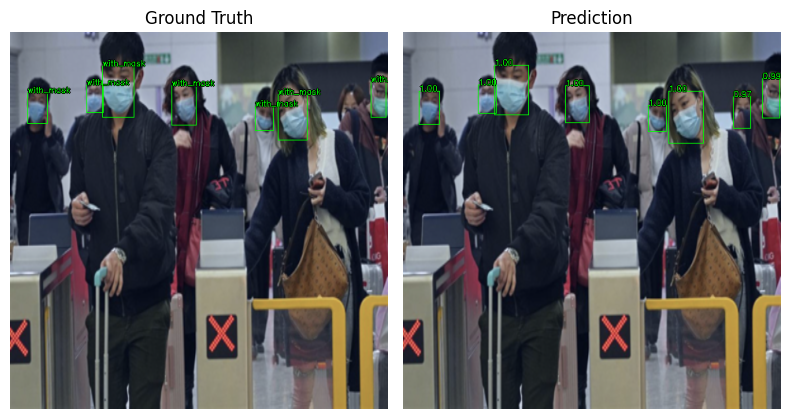

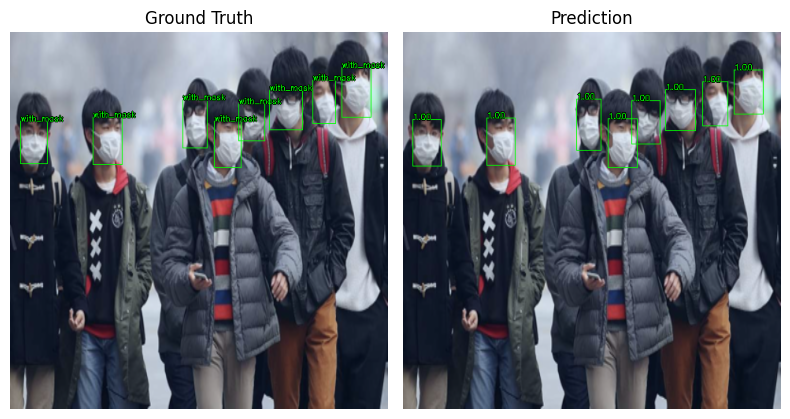

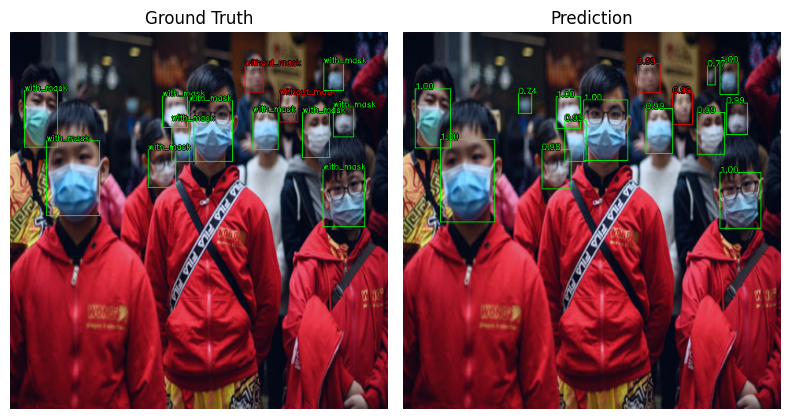

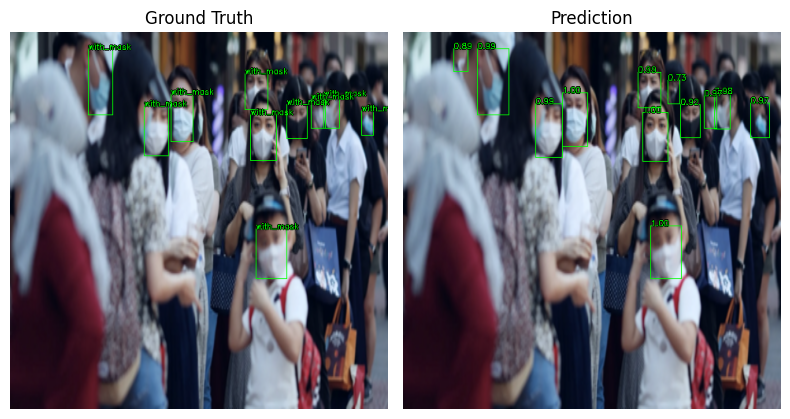

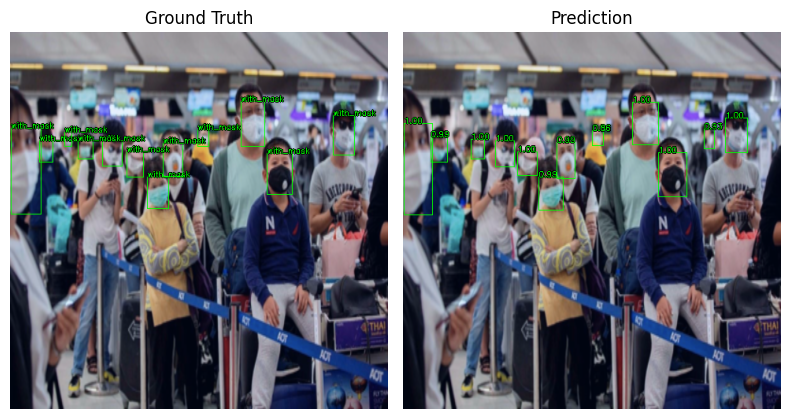

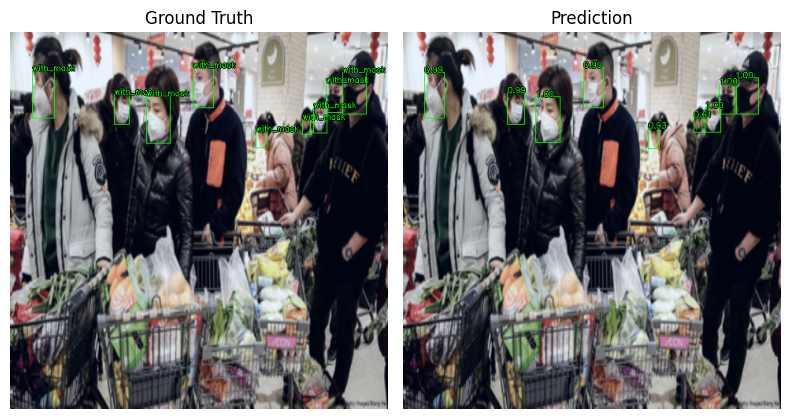

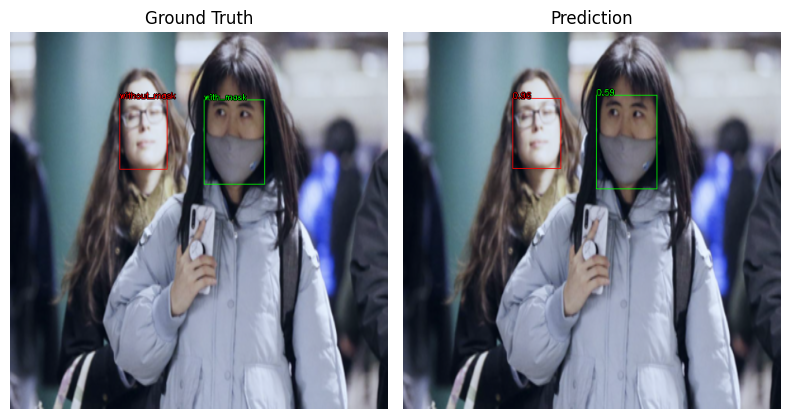

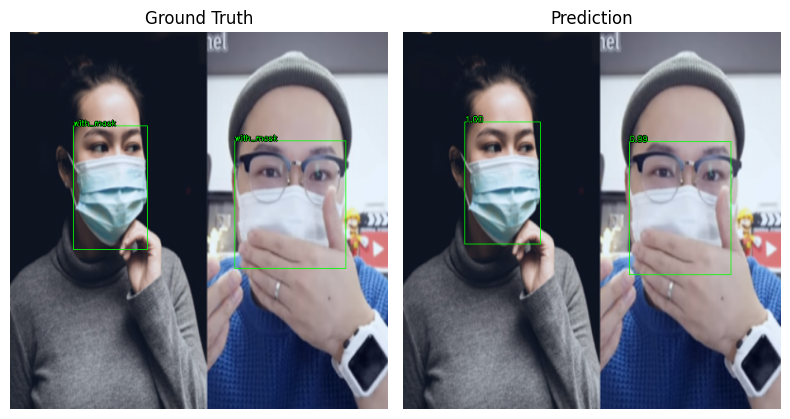

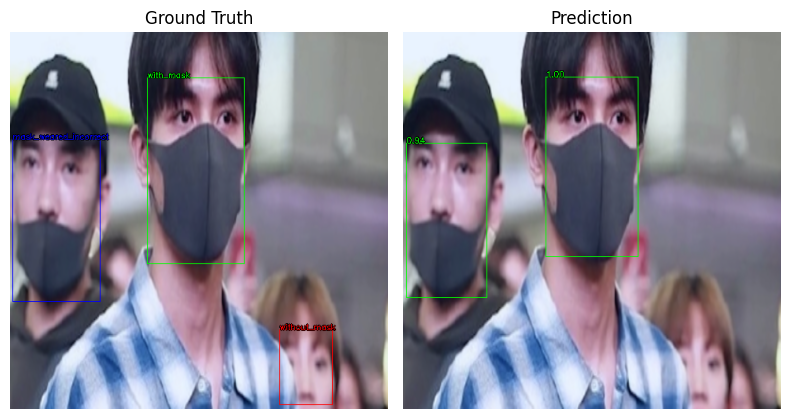

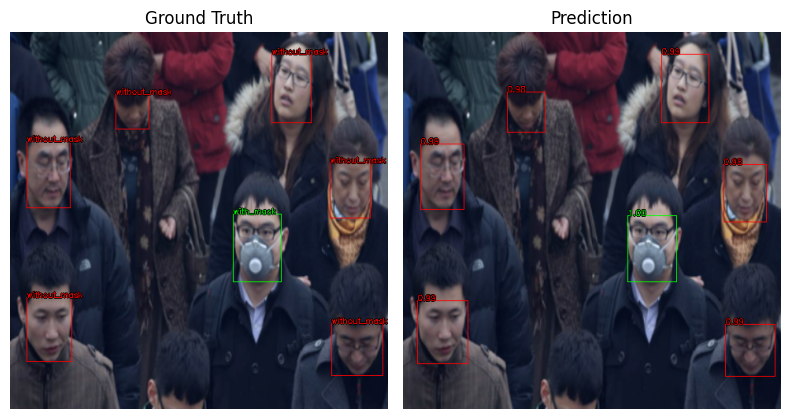

In [30]:
model = model.to(Config.device)
model.eval() # setting to evaluation mode

imgs, annts = next(iter(test_loader))
imgs = list(img.to(Config.device) for img in imgs)

with torch.no_grad():  # Disable gradient computation during inference
      output = model(imgs)

amount_samples = min(12, len(imgs))

for i, (img, ant, pred) in enumerate(zip(imgs, annts, output)):
      if i >= amount_samples:
            break

      fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(8,20))

      axes[0].set_title("Ground Truth")
      axes[1].set_title('Prediction')
      axes[0].axis('off')
      axes[1].axis('off')

      annot_img = get_annotated_img(img.cpu().detach().numpy(), ant)
      axes[0].imshow(norm(annot_img))

      # apply non-max suppres by threshold for a single image prediction
      keep = ops.nms(pred['boxes'], pred['scores'], Config.nms_thresh)
      keep_score = torch.where(pred['scores'] >= Config.score_threshold)[0]

      mask = torch.Tensor([1. if x in keep_score else 0. for x in keep])
      keep = torch.nonzero(mask).flatten()

      pred_thrs = pred
      pred_thrs['boxes'] = pred_thrs['boxes'][keep]
      pred_thrs['scores'] = pred_thrs['scores'][keep]
      pred_thrs['labels'] = pred_thrs['labels'][keep]

      pred_cpu = {k: v.cpu().detach().numpy() for k, v in pred_thrs.items()}

      annot_img = get_annotated_img(img.cpu().detach().numpy(), pred_cpu, is_pred=True) ##check if this is included in the function def i.e. `is_pred`
      axes[1].imshow(norm(annot_img))

      fig.tight_layout()
      plt.show()

#del imgs, pred, pred_thrs, pred_cpu
torch.cuda.empty_cache()

In [31]:
test_loader = DataLoader(test_set, batch_size=Config.batch_size, shuffle=False,
                        num_workers=Config.num_workers, collate_fn=collate_fn, pin_memory=True)

In [32]:
def get_pred_by_threshold_batch(preds, nms_threshold, score_threshold=0):
      '''
      Apply Non-maximum Suppression by threshold for batch (batch size can be equals to 1) 
      and return new predictions
      '''
      
      for i in range(len(preds)):
            ## apply NMS by threshold for on image and return new prediction

            # we only want the relevant bounding boxes
            keep = ops.nms(preds[i]['boxes'], preds[i]['scores'], nms_threshold)
            keep_score = torch.where(preds[i]['scores'] >= score_threshold)[0] #keep only scores above threshold
            mask = torch.Tensor([ 1. if x in keep_score else 0. for x in keep ])
            keep = torch.nonzero(mask).flatten()

            # creating a new prediction containing only the selected boxes selected through nms
            final_prediction = preds[i]
            final_prediction['boxes'] = final_prediction['boxes'][keep]
            final_prediction['scores'] = final_prediction['scores'][keep]
            final_prediction['labels'] = final_prediction['labels'][keep]

            preds[i] = final_prediction
            
      return preds


def get_iou_as_df(model, loader, nms_thresh, score_threshold=0):
      '''
      Calculates the Intersection over Union for the entire dataloader in the model and save the output prediction 
      in a dataframe with the following columns for a single boundary box:
      image_id, real_class, pred_class, score, iou
      '''
      device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
      model = model.to(device).eval()
    
      # init empty df to store the predictions
      #df = pd.DataFrame(columns=['image_id', 'real_class', 'pred_class', 'iou', 'score'])
      df = []

      with tqdm(total=len(loader), desc='evaluating IoU') as progress_bar:

            for img_batch, target_batch in loader:
                  # move batch to selected device (GPU in my case)
                  img_batch  = list(img.to(device) for img in img_batch)

                  # get predictions from the model and apply thresholding
                  with torch.no_grad():  # Disable gradient computation during inference
                        output_batch = model(img_batch)
                  output_batch = get_pred_by_threshold_batch(output_batch, nms_thresh, score_threshold)
                  
                  # convert preds to cpu
                  output_batch_cpu = [{k: v.cpu().detach() for k, v in t.items()} for t in output_batch]

                  for target, output in zip(target_batch, output_batch_cpu):
                        # compute the Intersection over Union (IoU) for each bounding box
                        ious =  ops.box_iou(output['boxes'], target['boxes'])
                        ious = torch.max(ious, dim=1)

                        # store predictions in df by iterating through IoU vals
                        for idx in range(len(ious.values)):
                              id_real_bbox = ious.indices[idx] # to which target box this prediction related
                              df.append({
                                    'image_id':   target['image_id'][0],
                                    'real_class': target['labels'][id_real_bbox], 
                                    'pred_class': output['labels'][idx],
                                    'score':      output['scores'][idx],
                                    'iou':        ious.values[idx],                
                                        })

                        del target, output

                  del img_batch, target_batch, output_batch, output_batch_cpu
                  torch.cuda.empty_cache()
                  progress_bar.update(1)
      df = pd.DataFrame(df)
      df = df.astype({ 'image_id':   np.int32,
                        'real_class': np.int32,
                        'pred_class': np.int32, 
                        'iou':        np.float32,
                        'score':      np.float32 })
      return df.sort_values('score', ascending=False, ignore_index=True)


Notice that the class format isn't the same as what the lecturer asked for. I'll have to edit it at the end. So that it is of
`[None, 'with_mask', 'without_mask', 'mask_weared_incorrect']`

this means instead of `[1,2,3]`, i want to get `[2,1,3]`

In [34]:
test_set.classes

[None, 'without_mask', 'with_mask', 'mask_weared_incorrect']

In [37]:
result_df = get_iou_as_df(model, test_loader, Config.nms_thresh, Config.score_threshold)

evaluating IoU: 100%|██████████| 9/9 [00:06<00:00,  1.38it/s]


In [38]:
result_df[result_df['real_class'] < result_df['pred_class']]

,image_id,real_class,pred_class,score,iou
432,38,1,2,0.953673,0.000000
458,38,1,2,0.922071,0.000000
480,27,1,2,0.857781,0.000000
490,83,1,2,0.798837,0.794643
525,38,1,2,0.682302,0.000000


As you can notice from the imbalance below, 2 represents w/mask, 1 represents w/out mask and 3 represents mask worn incorrectly. This needs to change.

In [43]:
result_df.real_class.value_counts()

real_class
2    450
1     74
3     25
Name: count, dtype: int64

In [45]:
def evaluation(model, loader, nms_thresh, score_threshold=0):
      '''Calculate the Mean Absolute Percentage Error for the model'''
      
      true_counts = np.zeros((len(loader.dataset), 3), dtype=np.int64)
      predicted_counts = np.zeros((len(loader.dataset), 3), dtype=np.int64)

      df = get_iou_as_df(model, loader, nms_thresh, score_threshold)
      classes = np.sort(df.real_class.unique()) 

      ## I want to flip the output such that it represents the format Sareh requested for
      ## current format is w/o_msk, w/msk, incorr --> classes[0], classes[1], classes[2]
      ## to adjust this, I want it to be true_counts[1], true_counts[0], true_counts[2] --> w/o_msk, w/msk, incorr
      ## same for predicted counts
      true_counts[:, 1] = df.groupby('image_id')['real_class'].apply(lambda x: (x == classes[0]).sum()).values
      true_counts[:, 0] = df.groupby('image_id')['real_class'].apply(lambda x: (x == classes[1]).sum()).values
      true_counts[:, 2] = df.groupby('image_id')['real_class'].apply(lambda x: (x == classes[2]).sum()).values

      predicted_counts[:, 1] = df.groupby('image_id')['pred_class'].apply(lambda x: (x == classes[0]).sum()).values
      predicted_counts[:, 0] = df.groupby('image_id')['pred_class'].apply(lambda x: (x == classes[1]).sum()).values
      predicted_counts[:, 2] = df.groupby('image_id')['pred_class'].apply(lambda x: (x == classes[2]).sum()).values

      # calculate MAPE
      abs_percentage_error = np.abs((true_counts - predicted_counts) / np.maximum(true_counts, 1))
      mape_per_class = np.mean(abs_percentage_error, axis=0) * 100
      mape = np.mean(mape_per_class)

      return true_counts, predicted_counts, mape, mape_per_class



In [46]:
tr_cnts, pred_cnts, mape, mape_class =  evaluation(model, test_loader, Config.nms_thresh, Config.score_threshold)

evaluating IoU: 100%|██████████| 9/9 [00:06<00:00,  1.37it/s]


### Final Answer for Q7
### Ensure that your class output is like wearing mask -- w/out mask -- incorr wearing msk. Done!

In [51]:
def count_masks(dataset):
      '''
      Will count the number of faces correctly wearing masks, without mask, and incorrectly wearing 
      masks. Output will be in the form of ['without_mask', 'with_mask', 'mask_weared_incorrect']
      '''
      # load trained weights

      model = get_model(Config.num_classes)
      model.load_state_dict(torch.load('./data/faster_rcnn_fold_5_MSKmodel.pth'))

      test_loader = DataLoader(test_set, batch_size=Config.batch_size, shuffle=False, 
                               num_workers=Config.num_workers, collate_fn=collate_fn,
                               pin_memory=True)
      
      tr_cnts, pred_cnts, mape, mape_class =  evaluation(model, test_loader, Config.nms_thresh,
                                                         Config.score_threshold)
      
      return pred_cnts, mape

In [48]:
val_annota_folder_path = 'data/Datasets_CV/MaskedFace/val'
val_df = create_annotation_df(val_annota_folder_path)

val_faceMasksData = FaceMaskData(Config.imgs_test_path, Config.msks_test_path, multilabelKFold=False, df_file=val_df)
# trainsize is set to 1 so that there'll be no split. 
x_test, y_test= val_faceMasksData.load_data(train_size=1, seed=Config.seed)

In [49]:
test_set = MaskedFaceTestDataset(x_test, y_test, Config.imgs_test_path, Config.msks_test_path,
                                 Config.img_width, Config.img_height, transform=test_trnf)


In [52]:
predicted_counts, mape = count_masks(test_set)

evaluating IoU: 100%|██████████| 9/9 [00:06<00:00,  1.44it/s]


In [57]:
np.save('./data/Q7_countmask_predicted_counts.npy', predicted_counts)
print('Predictions saved!')
print(f'MAPE score is {np.round(mape,4)}%')

Predictions saved!
MAPE score is 7.7683%


In [58]:
!pip freeze > requirements.txt